/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:110: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap(cmap)(i/n_clusters) for i in range(n_clusters)]
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:350: UserWarning: Glyph 21306 (\N{CJK UNIFIED IDEOGRAPH-533A}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:350: UserWarning: Glyph 38388 (\N{CJK UNIFIED IDEOGRAPH-95F4}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:350: UserWarning: Glyph 25240 (\N{CJK UNIFIED IDEOGRAPH-6298}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipyk

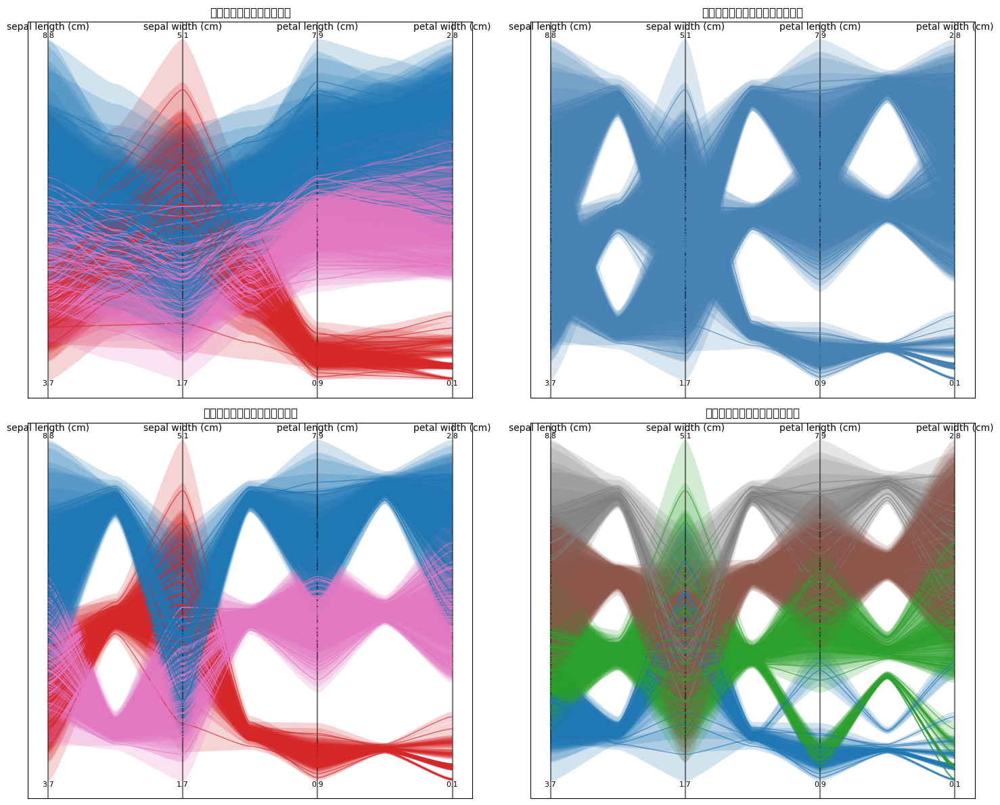

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:371: UserWarning: Glyph 26080 (\N{CJK UNIFIED IDEOGRAPH-65E0}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:371: UserWarning: Glyph 25414 (\N{CJK UNIFIED IDEOGRAPH-6346}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:371: UserWarning: Glyph 32465 (\N{CJK UNIFIED IDEOGRAPH-7ED1}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:371: UserWarning: Glyph 20013 (\N{CJK UNIFIED IDEOGRAPH-4E2D}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3696115215.py:371: UserWarning: Glyph 31561 (\N{CJK UNIFIED IDEOGRAPH-7B49}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/i

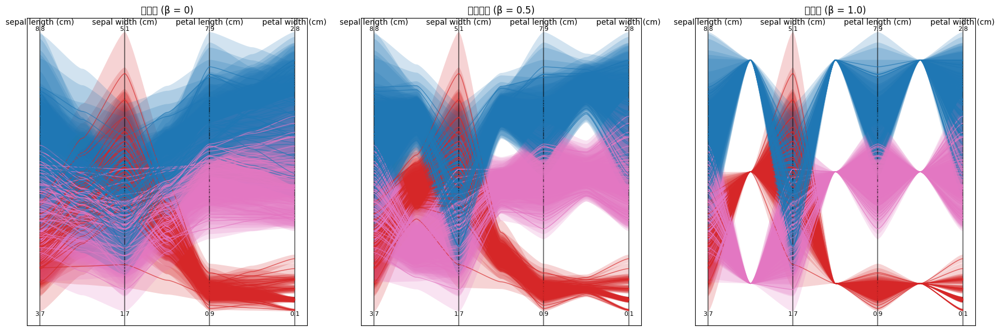

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_iris
from sklearn.cluster import KMeans
import matplotlib.patches as mpatches

def generate_bezier_curve(p0, p1, p2, p3, num_points=50):
    """生成从4个控制点构成的三次贝塞尔曲线"""
    t = np.linspace(0, 1, num_points)
    
    # 三次贝塞尔曲线公式
    curve = (1-t)**3 * p0[:, np.newaxis] + \
            3 * (1-t)**2 * t * p1[:, np.newaxis] + \
            3 * (1-t) * t**2 * p2[:, np.newaxis] + \
            t**3 * p3[:, np.newaxis]
    
    return curve.T

def compute_control_points(p_left, p_right, alpha=1/6, beta=0.8, centroid=None):
    """
    计算两点之间的三次贝塞尔曲线控制点，确保C1连续性
    
    参数:
    - p_left: 左轴上的点
    - p_right: 右轴上的点
    - alpha: 平滑度系数 (0-0.25)
    - beta: 捆绑强度 (0-1)
    - centroid: 虚拟轴上的聚类质心位置
    """
    # 中点（原始折线与虚拟轴的交点）
    mid_x = (p_left[0] + p_right[0]) / 2
    mid_y = (p_left[1] + p_right[1]) / 2
    
    # 如果有用于捆绑的质心，调整中点
    if centroid is not None:
        # 原始中点
        q = np.array([mid_x, mid_y])
        # 基于beta将中点向质心调整
        q_prime = q + beta * (centroid - q)
        mid_x, mid_y = q_prime
    
    # 左侧曲线段的控制点
    cp1_x = p_left[0] + alpha * (mid_x - p_left[0])
    cp1_y = p_left[1]
    
    # 右侧曲线段的控制点
    cp2_x = mid_x - alpha * (mid_x - p_left[0])
    cp2_y = mid_y
    
    cp3_x = mid_x + alpha * (p_right[0] - mid_x)
    cp3_y = mid_y
    
    cp4_x = p_right[0] - alpha * (p_right[0] - mid_x)
    cp4_y = p_right[1]
    
    return (mid_x, mid_y), (cp1_x, cp1_y), (cp2_x, cp2_y), (cp3_x, cp3_y), (cp4_x, cp4_y)

def plot_interval_curves(data, feature_names, clusters=None, alpha=1/6, beta=0.8, ax=None, 
                use_bundling=True, use_color=True, color_by_cluster=True, cmap='tab10', 
                uncertainty_alpha=0.2):
    """
    使用曲线和可选的捆绑绘制区间数据的平行坐标图
    
    参数:
    - data: 区间数据，格式为 (n_samples, n_dim, 2)，其中最后一个维度表示[lower, upper]
    - feature_names: 特征名称
    - clusters: 聚类分配 (可选)
    - alpha: 平滑度系数 (0-0.25)
    - beta: 捆绑强度 (0-1)
    - ax: matplotlib轴用于绘图
    - use_bundling: 是否使用曲线捆绑
    - use_color: 是否使用颜色
    - color_by_cluster: 按聚类着色或按单独属性着色
    - uncertainty_alpha: 不确定性区域的透明度
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 8))
    
    n_samples, n_features = data.shape[0], data.shape[1]
    
    # 设置轴
    axes_x = np.linspace(0, 1, n_features)
    
    # 提取下界和上界数据
    data_lower = data[:, :, 0]  # 下界
    data_upper = data[:, :, 1]  # 上界
    
    # 计算中心值
    data_center = (data_lower + data_upper) / 2
    
    # 找出所有数据的最小和最大值用于标准化
    all_mins = np.min(data_lower, axis=0)
    all_maxs = np.max(data_upper, axis=0)
    
    # 标准化区间数据
    norm_data_lower = (data_lower - all_mins) / (all_maxs - all_mins)
    norm_data_upper = (data_upper - all_mins) / (all_maxs - all_mins)
    norm_data_center = (data_center - all_mins) / (all_maxs - all_mins)
    
    # 绘制轴
    for i, x in enumerate(axes_x):
        ax.axvline(x=x, ymin=0, ymax=1, color='black', alpha=0.5)
        ax.text(x, 1.02, feature_names[i], ha='center', va='bottom')
    
    # 设置聚类颜色
    if clusters is None:
        clusters = np.zeros(n_samples, dtype=int)
    
    n_clusters = len(np.unique(clusters))
    colors = [plt.cm.get_cmap(cmap)(i/n_clusters) for i in range(n_clusters)]
    
    # 如果使用捆绑，则计算每个轴之间的区段的质心
    if use_bundling:
        centroids = []
        for i in range(n_features - 1):
            cluster_centroids = {}
            for cluster_id in np.unique(clusters):
                cluster_mask = clusters == cluster_id
                
                # 该聚类的左右点
                # 使用区间中点来计算质心
                lefts = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i]), 
                    norm_data_center[cluster_mask, i]
                ])
                rights = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i+1]), 
                    norm_data_center[cluster_mask, i+1]
                ])
                
                # 计算中点（原始折线与虚拟轴的交点）
                midpoints = []
                for j in range(lefts.shape[0]):
                    mid_x = (lefts[j, 0] + rights[j, 0]) / 2
                    mid_y = (lefts[j, 1] + rights[j, 1]) / 2
                    midpoints.append((mid_x, mid_y))
                
                # 中点的质心
                if midpoints:
                    midpoints = np.array(midpoints)
                    centroid = midpoints.mean(axis=0)
                    cluster_centroids[cluster_id] = centroid
            
            # 如果需要，均匀重新分布质心
            if cluster_centroids:
                # 按y值排序质心
                sorted_centroids = sorted(cluster_centroids.items(), key=lambda x: x[1][1])
                
                # 均匀重新分布
                y_values = np.linspace(0.1, 0.9, len(sorted_centroids))
                for (cluster_id, _), y in zip(sorted_centroids, y_values):
                    x = (axes_x[i] + axes_x[i+1]) / 2  # 区段中间
                    cluster_centroids[cluster_id] = np.array([x, y])
            
            centroids.append(cluster_centroids)
    
    # 绘制每条线及其不确定性区域
    for j in range(n_samples):
        # 获取该样本的下界、上界和中点值
        line_data_lower = norm_data_lower[j]
        line_data_upper = norm_data_upper[j]
        line_data_center = norm_data_center[j]
        
        points_lower = np.column_stack([axes_x, line_data_lower])
        points_upper = np.column_stack([axes_x, line_data_upper])
        points_center = np.column_stack([axes_x, line_data_center])
        
        if use_color and color_by_cluster:
            line_color = colors[clusters[j]]
        else:
            # 如果没有聚类或不使用颜色，则使用默认颜色
            line_color = 'steelblue'
        
        # 对每对相邻轴，绘制三个三次贝塞尔曲线：中心线、下边界和上边界
        for i in range(n_features - 1):
            # 为中心线计算控制点
            if use_bundling:
                # 获取该聚类在该区段的质心
                centroid = centroids[i].get(clusters[j], None)
            else:
                centroid = None
            
            # 中心线的控制点
            p_left_center = points_center[i]
            p_right_center = points_center[i+1]
            
            (mid_x_center, mid_y_center), (cp1_x_center, cp1_y_center), (cp2_x_center, cp2_y_center), \
                (cp3_x_center, cp3_y_center), (cp4_x_center, cp4_y_center) = \
                compute_control_points(p_left_center, p_right_center, alpha, beta, centroid)
            
            # 下边界的控制点
            p_left_lower = points_lower[i]
            p_right_lower = points_lower[i+1]
            
            (mid_x_lower, mid_y_lower), (cp1_x_lower, cp1_y_lower), (cp2_x_lower, cp2_y_lower), \
                (cp3_x_lower, cp3_y_lower), (cp4_x_lower, cp4_y_lower) = \
                compute_control_points(p_left_lower, p_right_lower, alpha, beta, centroid)
            
            # 上边界的控制点
            p_left_upper = points_upper[i]
            p_right_upper = points_upper[i+1]
            
            (mid_x_upper, mid_y_upper), (cp1_x_upper, cp1_y_upper), (cp2_x_upper, cp2_y_upper), \
                (cp3_x_upper, cp3_y_upper), (cp4_x_upper, cp4_y_upper) = \
                compute_control_points(p_left_upper, p_right_upper, alpha, beta, centroid)
            
            # 生成中心贝塞尔曲线（从左到中）
            curve1_center = generate_bezier_curve(
                p_left_center, 
                np.array([cp1_x_center, cp1_y_center]), 
                np.array([cp2_x_center, cp2_y_center]), 
                np.array([mid_x_center, mid_y_center])
            )
            
            # 生成中心贝塞尔曲线（从中到右）
            curve2_center = generate_bezier_curve(
                np.array([mid_x_center, mid_y_center]),
                np.array([cp3_x_center, cp3_y_center]),
                np.array([cp4_x_center, cp4_y_center]),
                p_right_center
            )
            
            # 合并曲线
            curve_center = np.vstack([curve1_center, curve2_center])
            
            # 生成下边界贝塞尔曲线（从左到中）
            curve1_lower = generate_bezier_curve(
                p_left_lower, 
                np.array([cp1_x_lower, cp1_y_lower]), 
                np.array([cp2_x_lower, cp2_y_lower]), 
                np.array([mid_x_lower, mid_y_lower])
            )
            
            # 生成下边界贝塞尔曲线（从中到右）
            curve2_lower = generate_bezier_curve(
                np.array([mid_x_lower, mid_y_lower]),
                np.array([cp3_x_lower, cp3_y_lower]),
                np.array([cp4_x_lower, cp4_y_lower]),
                p_right_lower
            )
            
            # 合并曲线
            curve_lower = np.vstack([curve1_lower, curve2_lower])
            
            # 生成上边界贝塞尔曲线（从左到中）
            curve1_upper = generate_bezier_curve(
                p_left_upper, 
                np.array([cp1_x_upper, cp1_y_upper]), 
                np.array([cp2_x_upper, cp2_y_upper]), 
                np.array([mid_x_upper, mid_y_upper])
            )
            
            # 生成上边界贝塞尔曲线（从中到右）
            curve2_upper = generate_bezier_curve(
                np.array([mid_x_upper, mid_y_upper]),
                np.array([cp3_x_upper, cp3_y_upper]),
                np.array([cp4_x_upper, cp4_y_upper]),
                p_right_upper
            )
            
            # 合并曲线
            curve_upper = np.vstack([curve1_upper, curve2_upper])
            
            # 绘制不确定性区域
            # 创建上下边界之间的多边形
            verts = np.vstack([curve_lower, curve_upper[::-1]])
            poly = mpatches.Polygon(verts, closed=True, facecolor=line_color, alpha=uncertainty_alpha)
            ax.add_patch(poly)
            
            # 绘制中心线
            ax.plot(curve_center[:, 0], curve_center[:, 1], color=line_color, alpha=0.7, linewidth=1)
    
    # 设置轴限制
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.05, 1.05)
    
    # 移除轴刻度和标签
    ax.set_xticks([])
    ax.set_yticks([])
    
    # 添加特征值标签
    for i, x in enumerate(axes_x):
        # 添加最小值和最大值标签
        ax.text(x, 0, f"{all_mins[i]:.1f}", ha='center', va='top', fontsize=8)
        ax.text(x, 1, f"{all_maxs[i]:.1f}", ha='center', va='bottom', fontsize=8)
    
    return ax

# 生成示例区间数据，格式为(n_samples, n_dim, 2)
def create_interval_dataset_format():
    # 加载鸢尾花数据集作为中心值
    iris = load_iris()
    data_center = iris.data
    feature_names = iris.feature_names
    n_samples, n_features = data_center.shape
    
    # 为每个数据点生成随机区间
    np.random.seed(42)
    # 生成不均匀的不确定性宽度
    uncertainty_lower = np.random.uniform(0.05, 0.15, size=(n_samples, n_features))
    uncertainty_upper = np.random.uniform(0.05, 0.15, size=(n_samples, n_features))
    
    # 创建区间数据，格式为(n_samples, n_dim, 2)
    interval_data = np.zeros((n_samples, n_features, 2))
    interval_data[:, :, 0] = data_center - uncertainty_lower * data_center  # 下界
    interval_data[:, :, 1] = data_center + uncertainty_upper * data_center  # 上界
    
    return interval_data, feature_names

# 主函数
def main():
    # 生成示例数据
    interval_data, feature_names = create_interval_dataset_format()
    
    # 计算中心点用于聚类
    data_center = (interval_data[:, :, 0] + interval_data[:, :, 1]) / 2
    
    # 使用K-means对中心值进行聚类，得到3个聚类
    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(data_center)
    
    # 创建带有不同配置的图形（类似于论文中的图）
    fig, axs = plt.subplots(2, 2, figsize=(15, 12))
    
    # 标准折线图，带有区间表示
    ax1 = axs[0, 0]
    # 我们使用捆绑强度β=0来模拟标准折线图
    plot_interval_curves(interval_data, feature_names, clusters, alpha=1/6, beta=0, 
                       use_bundling=False, use_color=True, ax=ax1)
    ax1.set_title('区间折线图（带颜色编码）')
    
    # 不带颜色编码的捆绑曲线区间图
    plot_interval_curves(interval_data, feature_names, clusters, alpha=1/6, beta=0.8, 
                       use_bundling=True, use_color=False, ax=axs[0, 1])
    axs[0, 1].set_title('捆绑曲线区间图（不带颜色编码）')
    
    # 带颜色编码的捆绑曲线区间图
    plot_interval_curves(interval_data, feature_names, clusters, alpha=1/6, beta=0.8, 
                       use_bundling=True, use_color=True, ax=axs[1, 0])
    axs[1, 0].set_title('捆绑曲线区间图（带颜色编码）')
    
    # 按属性着色的捆绑曲线区间图
    # 模拟按第一个特征对数据进行着色
    color_by_attr = np.zeros_like(clusters)
    attr_bins = np.digitize(data_center[:, 0], bins=[5.0, 6.0, 7.0])
    plot_interval_curves(interval_data, feature_names, attr_bins, alpha=1/6, beta=0.8,
                       use_bundling=True, use_color=True, ax=axs[1, 1])
    axs[1, 1].set_title('捆绑曲线区间图（按属性着色）')
    
    plt.tight_layout()
    plt.show()
    
    # 演示不同捆绑强度的影响
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    
    # 无捆绑 (beta = 0)
    plot_interval_curves(interval_data, feature_names, clusters, alpha=1/6, beta=0, 
                       use_bundling=True, use_color=True, ax=axs[0])
    axs[0].set_title('无捆绑 (β = 0)')
    
    # 中等捆绑 (beta = 0.5)
    plot_interval_curves(interval_data, feature_names, clusters, alpha=1/6, beta=0.5, 
                       use_bundling=True, use_color=True, ax=axs[1])
    axs[1].set_title('中等捆绑 (β = 0.5)')
    
    # 强捆绑 (beta = 1.0)
    plot_interval_curves(interval_data, feature_names, clusters, alpha=1/6, beta=1.0, 
                       use_bundling=True, use_color=True, ax=axs[2])
    axs[2].set_title('强捆绑 (β = 1.0)')
    
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    main()

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:323: UserWarning: Glyph 20351 (\N{CJK UNIFIED IDEOGRAPH-4F7F}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:323: UserWarning: Glyph 29992 (\N{CJK UNIFIED IDEOGRAPH-7528}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:323: UserWarning: Glyph 21407 (\N{CJK UNIFIED IDEOGRAPH-539F}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80

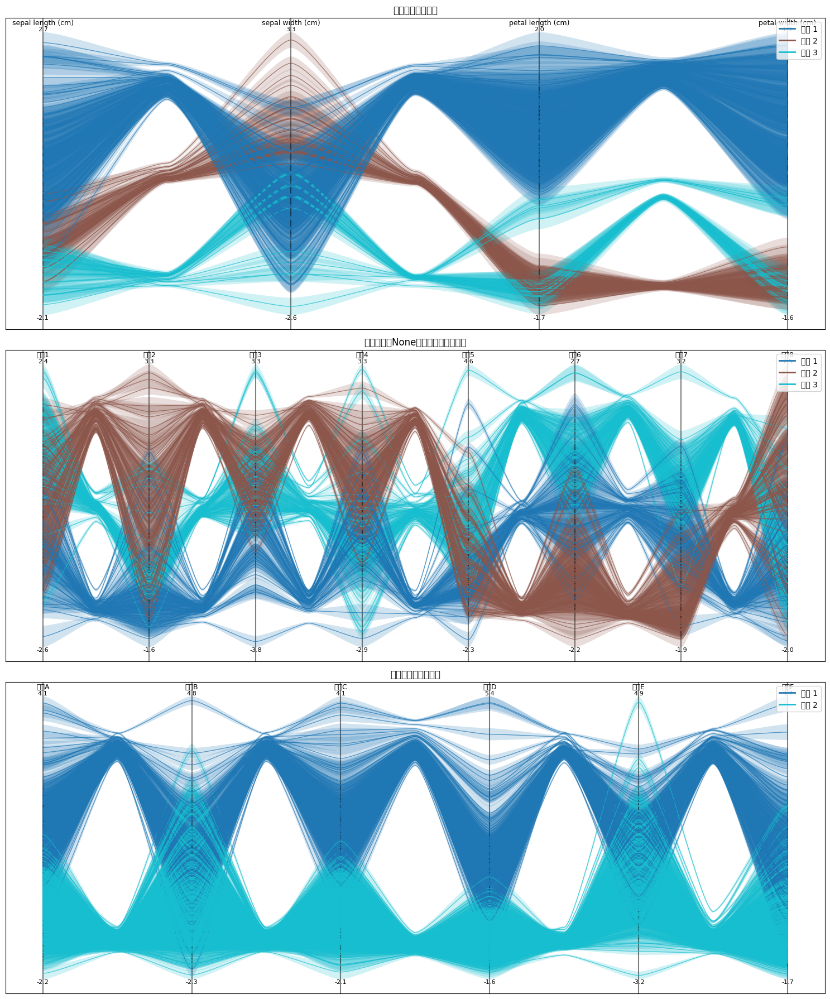

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:95: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:349: UserWarning: Glyph 20351 (\N{CJK UNIFIED IDEOGRAPH-4F7F}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:349: UserWarning: Glyph 29992 (\N{CJK UNIFIED IDEOGRAPH-7528}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/3067462029.py:349: UserWarning: Glyph 32858 (\N{CJK UNIFIED IDEOGRAPH-805A}) missing from current font.
  plt.tight_layout()
/var/folders/xw/3jk8jclj72zgxr733zl929m80

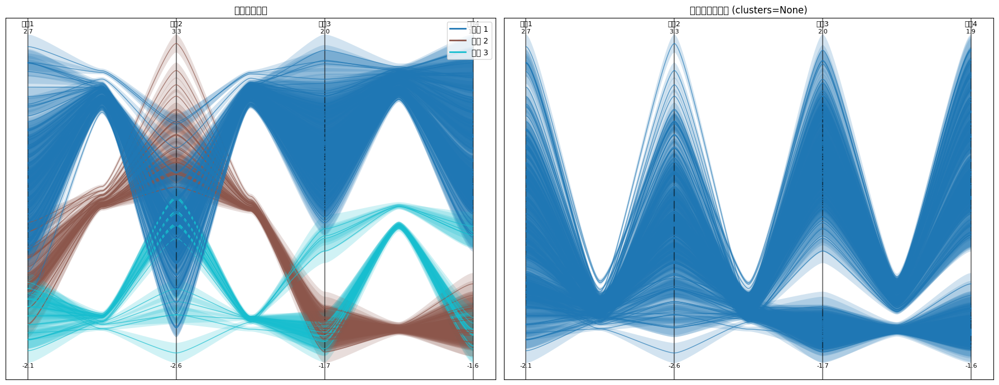

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/936615224.py:116: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]


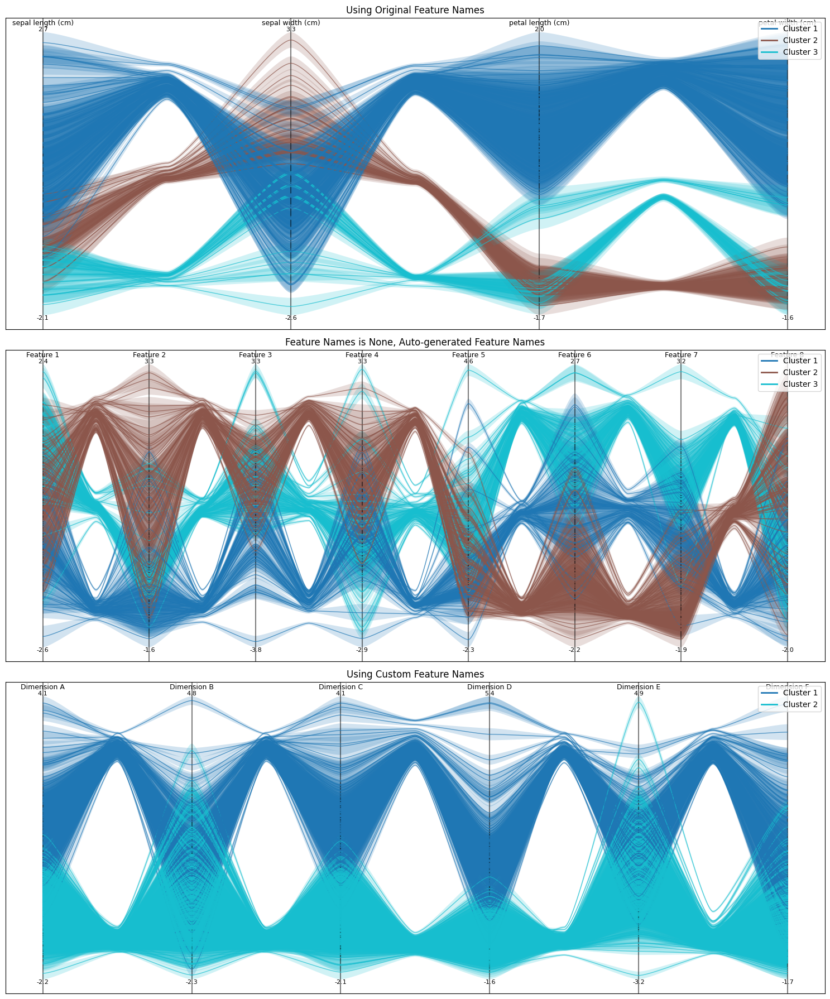

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/936615224.py:116: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]


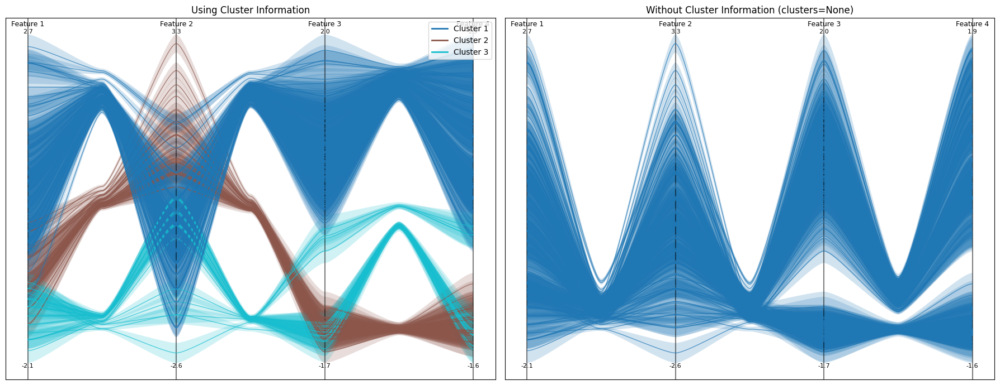

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/936615224.py:116: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]


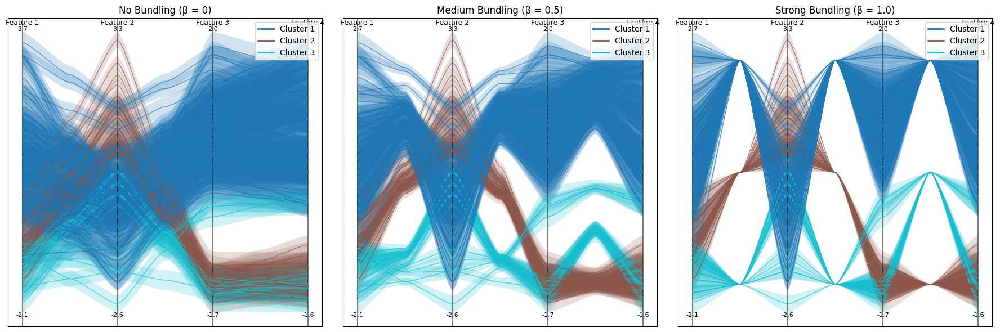

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.datasets import load_wine, load_iris, load_breast_cancer
from sklearn.preprocessing import StandardScaler
import matplotlib.patches as mpatches

# Functions for generating Bezier curves
def generate_bezier_curve(p0, p1, p2, p3, num_points=50):
    """Generate a cubic Bezier curve from 4 control points."""
    t = np.linspace(0, 1, num_points)
    
    # Cubic Bezier formula
    curve = (1-t)**3 * p0[:, np.newaxis] + \
            3 * (1-t)**2 * t * p1[:, np.newaxis] + \
            3 * (1-t) * t**2 * p2[:, np.newaxis] + \
            t**3 * p3[:, np.newaxis]
    
    return curve.T

def compute_control_points(p_left, p_right, alpha=1/6, beta=0.8, centroid=None):
    """
    Compute the control points for a cubic Bezier curve between two points
    with proper C1 continuity.
    
    Parameters:
    - p_left: point at the left axis
    - p_right: point at the right axis
    - alpha: smoothness scale (0-0.25)
    - beta: bundling strength (0-1)
    - centroid: cluster centroid position at the virtual axis
    """
    # Middle point (original polyline intersection with virtual axis)
    mid_x = (p_left[0] + p_right[0]) / 2
    mid_y = (p_left[1] + p_right[1]) / 2
    
    # If we have a centroid for bundling, adjust the mid point
    if centroid is not None:
        # Original midpoint
        q = np.array([mid_x, mid_y])
        # Adjust midpoint towards centroid based on beta
        q_prime = q + beta * (centroid - q)
        mid_x, mid_y = q_prime
    
    # Control points for the left curve segment
    cp1_x = p_left[0] + alpha * (mid_x - p_left[0])
    cp1_y = p_left[1]
    
    # Control points for the right curve segment
    cp2_x = mid_x - alpha * (mid_x - p_left[0])
    cp2_y = mid_y
    
    cp3_x = mid_x + alpha * (p_right[0] - mid_x)
    cp3_y = mid_y
    
    cp4_x = p_right[0] - alpha * (p_right[0] - mid_x)
    cp4_y = p_right[1]
    
    return (mid_x, mid_y), (cp1_x, cp1_y), (cp2_x, cp2_y), (cp3_x, cp3_y), (cp4_x, cp4_y)

def plot_interval_curves(data, feature_names=None, clusters=None, alpha=1/6, beta=0.8, ax=None, 
                use_bundling=True, use_color=True, uncertainty_alpha=0.2):
    """
    Plot parallel coordinates with curve bundling for interval data.
    
    Parameters:
    - data: interval data in format (n_samples, n_dim, 2), where the last dimension represents [lower, upper]
    - feature_names: list of feature names, if None, will auto-generate names
    - clusters: cluster assignments, if None, all data will be treated as one cluster
    - alpha: smoothness scale (0-0.25)
    - beta: bundling strength (0-1)
    - ax: matplotlib axis
    - use_bundling: whether to use curve bundling
    - use_color: whether to use color coding
    - uncertainty_alpha: transparency of uncertainty regions
    """
    if ax is None:
        fig, ax = plt.subplots(figsize=(12, 8))
    
    n_samples, n_features = data.shape[0], data.shape[1]
    
    # If feature_names is None, auto-generate feature names
    if feature_names is None:
        feature_names = [f"Feature {i+1}" for i in range(n_features)]
    
    # Set up axes - dynamically adapt to number of dimensions
    axes_x = np.linspace(0, 1, n_features)
    
    # Extract lower and upper bounds
    data_lower = data[:, :, 0]
    data_upper = data[:, :, 1]
    data_center = (data_lower + data_upper) / 2
    
    # Normalize data
    all_mins = np.min(data_lower, axis=0)
    all_maxs = np.max(data_upper, axis=0)
    
    # Handle potential division by zero
    range_values = all_maxs - all_mins
    range_values[range_values == 0] = 1  # Avoid division by zero
    
    norm_data_lower = (data_lower - all_mins) / range_values
    norm_data_upper = (data_upper - all_mins) / range_values
    norm_data_center = (data_center - all_mins) / range_values
    
    # Draw the axes
    for i, x in enumerate(axes_x):
        ax.axvline(x=x, ymin=0, ymax=1, color='black', alpha=0.5)
        ax.text(x, 1.02, feature_names[i], ha='center', va='bottom', fontsize=9)
    
    # Set up cluster colors
    if clusters is None:
        clusters = np.zeros(n_samples, dtype=int)
    
    n_clusters = len(np.unique(clusters))
    colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]
    
    # Calculate centroids for bundling
    if use_bundling:
        centroids = []
        for i in range(n_features - 1):
            cluster_centroids = {}
            for cluster_id in np.unique(clusters):
                cluster_mask = clusters == cluster_id
                
                # Skip clusters with no data points
                if not np.any(cluster_mask):
                    continue
                
                lefts = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i]), 
                    norm_data_center[cluster_mask, i]
                ])
                rights = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i+1]), 
                    norm_data_center[cluster_mask, i+1]
                ])
                
                midpoints = []
                for j in range(lefts.shape[0]):
                    mid_x = (lefts[j, 0] + rights[j, 0]) / 2
                    mid_y = (lefts[j, 1] + rights[j, 1]) / 2
                    midpoints.append((mid_x, mid_y))
                
                if midpoints:
                    midpoints = np.array(midpoints)
                    centroid = midpoints.mean(axis=0)
                    cluster_centroids[cluster_id] = centroid
            
            # Redistribute centroids
            if cluster_centroids:
                sorted_centroids = sorted(cluster_centroids.items(), key=lambda x: x[1][1])
                y_values = np.linspace(0.1, 0.9, len(sorted_centroids))
                for (cluster_id, _), y in zip(sorted_centroids, y_values):
                    x = (axes_x[i] + axes_x[i+1]) / 2
                    cluster_centroids[cluster_id] = np.array([x, y])
            
            centroids.append(cluster_centroids)
    
    # Draw each line and its uncertainty region
    for j in range(n_samples):
        line_data_lower = norm_data_lower[j]
        line_data_upper = norm_data_upper[j]
        line_data_center = norm_data_center[j]
        
        points_lower = np.column_stack([axes_x, line_data_lower])
        points_upper = np.column_stack([axes_x, line_data_upper])
        points_center = np.column_stack([axes_x, line_data_center])
        
        if use_color:
            line_color = colors[clusters[j]]
        else:
            line_color = 'steelblue'
        
        # For each pair of adjacent axes, draw curves
        for i in range(n_features - 1):
            if use_bundling:
                centroid = centroids[i].get(clusters[j], None)
            else:
                centroid = None
            
            # Center line control points
            p_left_center = points_center[i]
            p_right_center = points_center[i+1]
            
            (mid_x_center, mid_y_center), (cp1_x, cp1_y), (cp2_x, cp2_y), \
                (cp3_x, cp3_y), (cp4_x, cp4_y) = \
                compute_control_points(p_left_center, p_right_center, alpha, beta, centroid)
            
            # Lower bound control points
            p_left_lower = points_lower[i]
            p_right_lower = points_lower[i+1]
            
            (mid_x_lower, mid_y_lower), (cp1_x_lower, cp1_y_lower), (cp2_x_lower, cp2_y_lower), \
                (cp3_x_lower, cp3_y_lower), (cp4_x_lower, cp4_y_lower) = \
                compute_control_points(p_left_lower, p_right_lower, alpha, beta, centroid)
            
            # Upper bound control points
            p_left_upper = points_upper[i]
            p_right_upper = points_upper[i+1]
            
            (mid_x_upper, mid_y_upper), (cp1_x_upper, cp1_y_upper), (cp2_x_upper, cp2_y_upper), \
                (cp3_x_upper, cp3_y_upper), (cp4_x_upper, cp4_y_upper) = \
                compute_control_points(p_left_upper, p_right_upper, alpha, beta, centroid)
            
            # Generate curves
            # Center curve (left to mid)
            curve1_center = generate_bezier_curve(
                p_left_center, 
                np.array([cp1_x, cp1_y]), 
                np.array([cp2_x, cp2_y]), 
                np.array([mid_x_center, mid_y_center])
            )
            
            # Center curve (mid to right)
            curve2_center = generate_bezier_curve(
                np.array([mid_x_center, mid_y_center]),
                np.array([cp3_x, cp3_y]),
                np.array([cp4_x, cp4_y]),
                p_right_center
            )
            
            curve_center = np.vstack([curve1_center, curve2_center])
            
            # Lower bound curve (left to mid)
            curve1_lower = generate_bezier_curve(
                p_left_lower, 
                np.array([cp1_x_lower, cp1_y_lower]), 
                np.array([cp2_x_lower, cp2_y_lower]), 
                np.array([mid_x_lower, mid_y_lower])
            )
            
            # Lower bound curve (mid to right)
            curve2_lower = generate_bezier_curve(
                np.array([mid_x_lower, mid_y_lower]),
                np.array([cp3_x_lower, cp3_y_lower]),
                np.array([cp4_x_lower, cp4_y_lower]),
                p_right_lower
            )
            
            curve_lower = np.vstack([curve1_lower, curve2_lower])
            
            # Upper bound curve (left to mid)
            curve1_upper = generate_bezier_curve(
                p_left_upper, 
                np.array([cp1_x_upper, cp1_y_upper]), 
                np.array([cp2_x_upper, cp2_y_upper]), 
                np.array([mid_x_upper, mid_y_upper])
            )
            
            # Upper bound curve (mid to right)
            curve2_upper = generate_bezier_curve(
                np.array([mid_x_upper, mid_y_upper]),
                np.array([cp3_x_upper, cp3_y_upper]),
                np.array([cp4_x_upper, cp4_y_upper]),
                p_right_upper
            )
            
            curve_upper = np.vstack([curve1_upper, curve2_upper])
            
            # Draw uncertainty region
            verts = np.vstack([curve_lower, curve_upper[::-1]])
            poly = mpatches.Polygon(verts, closed=True, facecolor=line_color, alpha=uncertainty_alpha)
            ax.add_patch(poly)
            
            # Draw center line
            ax.plot(curve_center[:, 0], curve_center[:, 1], color=line_color, alpha=0.7, linewidth=1)
    
    # Set axis limits
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.05, 1.05)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Add feature value labels
    for i, x in enumerate(axes_x):
        ax.text(x, 0, f"{all_mins[i]:.1f}", ha='center', va='top', fontsize=8)
        ax.text(x, 1, f"{all_maxs[i]:.1f}", ha='center', va='bottom', fontsize=8)
    
    # Add legend (when using color coding)
    if use_color and n_clusters > 1:
        handles = []
        for i in range(n_clusters):
            handles.append(plt.Line2D([0], [0], color=colors[i], lw=2, label=f'Cluster {i+1}'))
        ax.legend(handles=handles, loc='upper right')
    
    return ax

# Create interval datasets with different dimensions
def create_interval_dataset(data):
    """Create interval data from any dataset"""
    n_samples, n_features = data.shape
    
    # Standardize original data for better comparison
    scaler = StandardScaler()
    data = scaler.fit_transform(data)
    
    # Generate random intervals for each data point
    np.random.seed(42)
    uncertainty_lower = np.random.uniform(0.1, 0.2, size=(n_samples, n_features))
    uncertainty_upper = np.random.uniform(0.1, 0.2, size=(n_samples, n_features))
    
    # Create interval data
    interval_data = np.zeros((n_samples, n_features, 2))
    interval_data[:, :, 0] = data - uncertainty_lower  # lower bound
    interval_data[:, :, 1] = data + uncertainty_upper  # upper bound
    
    return interval_data

# Demonstrate feature_names=None case
def feature_names_none_demo():
    # Load datasets
    iris = load_iris()
    wine = load_wine()
    cancer = load_breast_cancer()
    
    # Create interval data
    iris_data = create_interval_dataset(iris.data)
    wine_data = create_interval_dataset(wine.data[:, :8])  # first 8 features
    cancer_data = create_interval_dataset(cancer.data[:, :6])  # first 6 features
    
    # Calculate center values for clustering
    iris_center = (iris_data[:, :, 0] + iris_data[:, :, 1]) / 2
    wine_center = (wine_data[:, :, 0] + wine_data[:, :, 1]) / 2
    cancer_center = (cancer_data[:, :, 0] + cancer_data[:, :, 1]) / 2
    
    iris_clusters = KMeans(n_clusters=3, random_state=42).fit_predict(iris_center)
    wine_clusters = KMeans(n_clusters=3, random_state=42).fit_predict(wine_center)
    cancer_clusters = KMeans(n_clusters=2, random_state=42).fit_predict(cancer_center)
    
    # Create figures to demonstrate different cases
    fig, axs = plt.subplots(3, 1, figsize=(15, 18))
    
    # 1. Using original feature names
    plot_interval_curves(iris_data, iris.feature_names, iris_clusters, 
                       alpha=1/6, beta=0.8, ax=axs[0])
    axs[0].set_title('Using Original Feature Names')
    
    # 2. Feature names is None, auto-generated
    plot_interval_curves(wine_data, None, wine_clusters, 
                       alpha=1/6, beta=0.8, ax=axs[1])
    axs[1].set_title('Feature Names is None, Auto-generated Feature Names')
    
    # 3. Custom feature names
    custom_names = ["Dimension A", "Dimension B", "Dimension C", "Dimension D", "Dimension E", "Dimension F"]
    plot_interval_curves(cancer_data, custom_names, cancer_clusters, 
                       alpha=1/6, beta=0.8, ax=axs[2])
    axs[2].set_title('Using Custom Feature Names')
    
    plt.tight_layout()
    plt.show()

# Demonstrate clusters=None case
def clusters_none_demo():
    # Load data
    iris = load_iris()
    iris_data = create_interval_dataset(iris.data)
    
    # Calculate centers for clustering
    iris_center = (iris_data[:, :, 0] + iris_data[:, :, 1]) / 2
    iris_clusters = KMeans(n_clusters=3, random_state=42).fit_predict(iris_center)
    
    # Create figures for comparison
    fig, axs = plt.subplots(1, 2, figsize=(18, 7))
    
    # 1. Using clusters
    plot_interval_curves(iris_data, None, iris_clusters, 
                       alpha=1/6, beta=0.8, ax=axs[0])
    axs[0].set_title('Using Cluster Information')
    
    # 2. Without using clusters (clusters=None)
    plot_interval_curves(iris_data, None, None, 
                       alpha=1/6, beta=0.8, ax=axs[1])
    axs[1].set_title('Without Cluster Information (clusters=None)')
    
    plt.tight_layout()
    plt.show()

# Demonstrate different bundling strengths
def bundling_strength_demo():
    # Load data
    iris = load_iris()
    iris_data = create_interval_dataset(iris.data)
    
    # Calculate centers for clustering
    iris_center = (iris_data[:, :, 0] + iris_data[:, :, 1]) / 2
    iris_clusters = KMeans(n_clusters=3, random_state=42).fit_predict(iris_center)
    
    # Create figures showing different bundling strengths
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))
    
    # No bundling (beta = 0)
    plot_interval_curves(iris_data, None, iris_clusters, 
                       alpha=1/6, beta=0, ax=axs[0])
    axs[0].set_title('No Bundling (β = 0)')
    
    # Medium bundling (beta = 0.5)
    plot_interval_curves(iris_data, None, iris_clusters, 
                       alpha=1/6, beta=0.5, ax=axs[1])
    axs[1].set_title('Medium Bundling (β = 0.5)')
    
    # Strong bundling (beta = 1.0)
    plot_interval_curves(iris_data, None, iris_clusters, 
                       alpha=1/6, beta=1.0, ax=axs[2])
    axs[2].set_title('Strong Bundling (β = 1.0)')
    
    plt.tight_layout()
    plt.show()

# Run demonstrations
if __name__ == "__main__":
    feature_names_none_demo()
    clusters_none_demo()
    bundling_strength_demo()

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_45002/4044887596.py:209: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap(cmap)(i/max(1, n_clusters-1)) for i in range(n_clusters)]


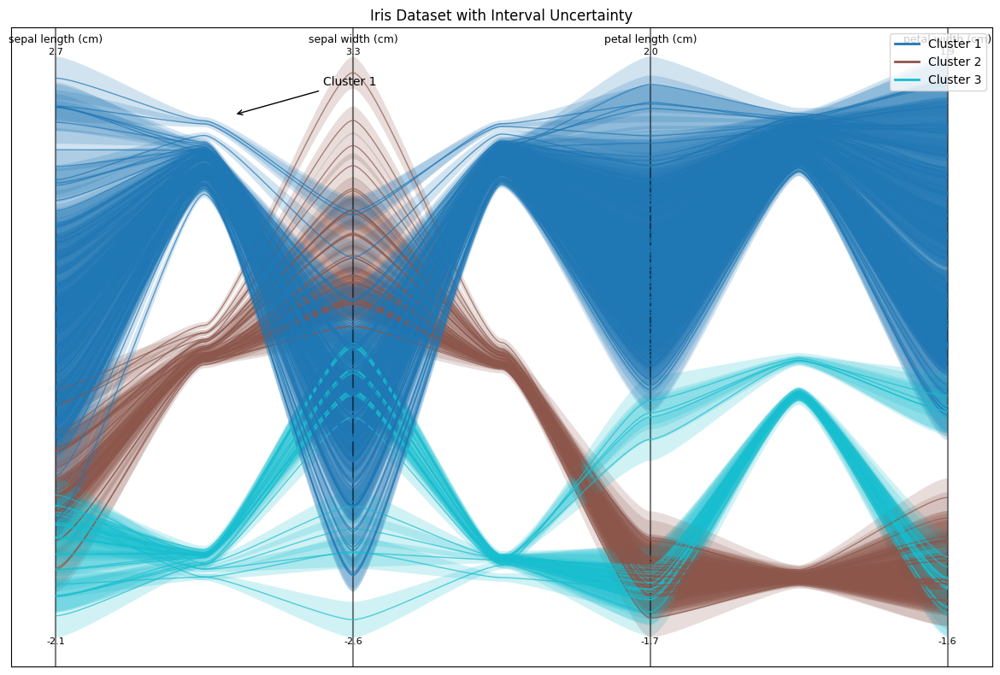

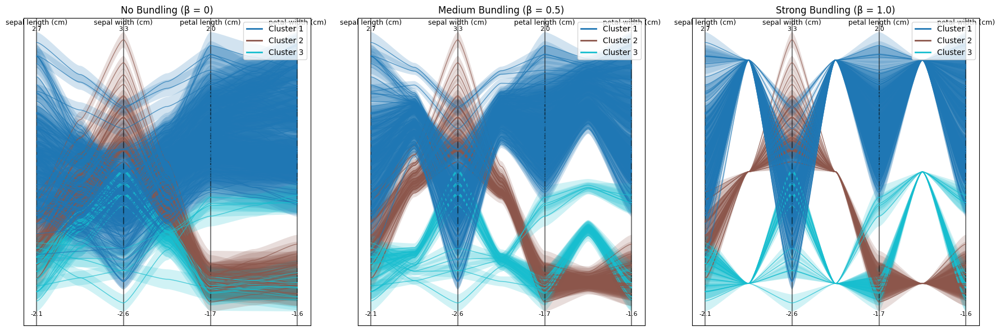

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as mpatches
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler


def generate_bezier_curve(p0, p1, p2, p3, num_points=50):
    """
    Generate a cubic Bezier curve from 4 control points.
    
    Parameters:
    -----------
    p0, p1, p2, p3 : numpy.ndarray
        Control points for the Bezier curve.
    num_points : int, default=50
        Number of points to generate along the curve.
        
    Returns:
    --------
    numpy.ndarray
        Array of points along the Bezier curve.
    """
    t = np.linspace(0, 1, num_points)
    
    # Cubic Bezier formula
    curve = (1-t)**3 * p0[:, np.newaxis] + \
            3 * (1-t)**2 * t * p1[:, np.newaxis] + \
            3 * (1-t) * t**2 * p2[:, np.newaxis] + \
            t**3 * p3[:, np.newaxis]
    
    return curve.T


def compute_control_points(p_left, p_right, alpha=1/6, beta=0.8, centroid=None):
    """
    Compute the control points for a cubic Bezier curve between two points
    with proper C1 continuity.
    
    Parameters:
    -----------
    p_left : numpy.ndarray
        Point at the left axis.
    p_right : numpy.ndarray
        Point at the right axis.
    alpha : float, default=1/6
        Smoothness scale (0-0.25). Controls how closely curves approximate polylines.
    beta : float, default=0.8
        Bundling strength (0-1). Controls how tightly curves are bundled.
    centroid : numpy.ndarray, optional
        Cluster centroid position at the virtual axis.
        
    Returns:
    --------
    tuple
        Tuple of control points for the Bezier curve.
    """
    # Middle point (original polyline intersection with virtual axis)
    mid_x = (p_left[0] + p_right[0]) / 2
    mid_y = (p_left[1] + p_right[1]) / 2
    
    # If we have a centroid for bundling, adjust the mid point
    if centroid is not None:
        # Original midpoint
        q = np.array([mid_x, mid_y])
        # Adjust midpoint towards centroid based on beta
        q_prime = q + beta * (centroid - q)
        mid_x, mid_y = q_prime
    
    # Control points for the left curve segment
    cp1_x = p_left[0] + alpha * (mid_x - p_left[0])
    cp1_y = p_left[1]
    
    # Control points for the right curve segment
    cp2_x = mid_x - alpha * (mid_x - p_left[0])
    cp2_y = mid_y
    
    cp3_x = mid_x + alpha * (p_right[0] - mid_x)
    cp3_y = mid_y
    
    cp4_x = p_right[0] - alpha * (p_right[0] - mid_x)
    cp4_y = p_right[1]
    
    return (mid_x, mid_y), (cp1_x, cp1_y), (cp2_x, cp2_y), (cp3_x, cp3_y), (cp4_x, cp4_y)


def cluster_data(data, method='kmeans', n_clusters=3, random_state=42):
    """
    Perform clustering on interval data.
    
    Parameters:
    -----------
    data : numpy.ndarray
        Interval data in format (n_samples, n_dim, 2), where the last dimension 
        represents [lower, upper].
    method : str, default='kmeans'
        Clustering method to use. Currently supports 'kmeans'.
    n_clusters : int, default=3
        Number of clusters to use for clustering.
    random_state : int, default=42
        Random state for reproducibility.
        
    Returns:
    --------
    numpy.ndarray
        Cluster assignments for each data point.
    """
    # Extract center points for clustering
    data_center = (data[:, :, 0] + data[:, :, 1]) / 2
    
    if method == 'kmeans':
        kmeans = KMeans(n_clusters=n_clusters, random_state=random_state)
        clusters = kmeans.fit_predict(data_center)
        return clusters
    else:
        # Default to no clustering
        return np.zeros(data.shape[0], dtype=int)


def plot_interval_parallel_coordinates(data, feature_names=None, clusters=None, 
                                      alpha=1/6, beta=0.8, uncertainty_alpha=0.2,
                                      figsize=(12, 8), ax=None, use_bundling=True, 
                                      use_color=True, cmap='tab10', title=None,
                                      show_legend=True):
    """
    Plot parallel coordinates with curve bundling for interval data.
    
    Parameters:
    -----------
    data : numpy.ndarray
        Interval data in format (n_samples, n_dim, 2), where the last dimension 
        represents [lower, upper].
    feature_names : list, optional
        Names of features. If None, auto-generated names are used.
    clusters : numpy.ndarray, optional
        Cluster assignments for each data point. If None, all data is treated as one cluster.
    alpha : float, default=1/6
        Smoothness scale parameter (0-0.25). Controls how closely curves approximate polylines.
    beta : float, default=0.8
        Bundling strength parameter (0-1). Controls how tightly curves are bundled.
    uncertainty_alpha : float, default=0.2
        Transparency of the uncertainty regions.
    figsize : tuple, default=(12, 8)
        Figure size if creating a new figure.
    ax : matplotlib.axes.Axes, optional
        Matplotlib axes to plot on. If None, a new figure is created.
    use_bundling : bool, default=True
        Whether to use curve bundling.
    use_color : bool, default=True
        Whether to use color coding for clusters.
    cmap : str, default='tab10'
        Colormap to use for clusters.
    title : str, optional
        Title for the plot.
    show_legend : bool, default=True
        Whether to show the legend for clusters.
        
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object.
    ax : matplotlib.axes.Axes
        The axes object.
    """
    # Create figure and axes if not provided
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    else:
        fig = ax.figure
    
    n_samples, n_features = data.shape[0], data.shape[1]
    
    # If clusters is None, assign all to same cluster
    if clusters is None:
        clusters = np.zeros(n_samples, dtype=int)
    
    # Extract lower and upper bounds and compute center
    data_lower = data[:, :, 0]
    data_upper = data[:, :, 1]
    data_center = (data_lower + data_upper) / 2
    
    # If feature_names is None, auto-generate feature names
    if feature_names is None:
        feature_names = [f"Feature {i+1}" for i in range(n_features)]
    
    # Set up axes
    axes_x = np.linspace(0, 1, n_features)
    
    # Normalize data
    all_mins = np.min(data_lower, axis=0)
    all_maxs = np.max(data_upper, axis=0)
    
    # Handle potential division by zero
    range_values = all_maxs - all_mins
    range_values[range_values == 0] = 1  # Avoid division by zero
    
    norm_data_lower = (data_lower - all_mins) / range_values
    norm_data_upper = (data_upper - all_mins) / range_values
    norm_data_center = (data_center - all_mins) / range_values
    
    # Draw the axes
    for i, x in enumerate(axes_x):
        ax.axvline(x=x, ymin=0, ymax=1, color='black', alpha=0.5)
        ax.text(x, 1.02, feature_names[i], ha='center', va='bottom', fontsize=9)
    
    # Set up cluster colors
    n_clusters = len(np.unique(clusters))
    colors = [plt.cm.get_cmap(cmap)(i/max(1, n_clusters-1)) for i in range(n_clusters)]
    
    # Calculate centroids for bundling
    if use_bundling:
        centroids = []
        for i in range(n_features - 1):
            cluster_centroids = {}
            for cluster_id in np.unique(clusters):
                cluster_mask = clusters == cluster_id
                
                # Skip clusters with no data points
                if not np.any(cluster_mask):
                    continue
                
                lefts = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i]), 
                    norm_data_center[cluster_mask, i]
                ])
                rights = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i+1]), 
                    norm_data_center[cluster_mask, i+1]
                ])
                
                midpoints = []
                for j in range(lefts.shape[0]):
                    mid_x = (lefts[j, 0] + rights[j, 0]) / 2
                    mid_y = (lefts[j, 1] + rights[j, 1]) / 2
                    midpoints.append((mid_x, mid_y))
                
                if midpoints:
                    midpoints = np.array(midpoints)
                    centroid = midpoints.mean(axis=0)
                    cluster_centroids[cluster_id] = centroid
            
            # Redistribute centroids
            if cluster_centroids:
                sorted_centroids = sorted(cluster_centroids.items(), key=lambda x: x[1][1])
                y_values = np.linspace(0.1, 0.9, len(sorted_centroids))
                for (cluster_id, _), y in zip(sorted_centroids, y_values):
                    x = (axes_x[i] + axes_x[i+1]) / 2
                    cluster_centroids[cluster_id] = np.array([x, y])
            
            centroids.append(cluster_centroids)
    
    # Draw each line and its uncertainty region
    for j in range(n_samples):
        line_data_lower = norm_data_lower[j]
        line_data_upper = norm_data_upper[j]
        line_data_center = norm_data_center[j]
        
        points_lower = np.column_stack([axes_x, line_data_lower])
        points_upper = np.column_stack([axes_x, line_data_upper])
        points_center = np.column_stack([axes_x, line_data_center])
        
        if use_color:
            line_color = colors[clusters[j]]
        else:
            line_color = 'steelblue'
        
        # For each pair of adjacent axes, draw curves
        for i in range(n_features - 1):
            if use_bundling:
                centroid = centroids[i].get(clusters[j], None)
            else:
                centroid = None
            
            # Center line control points
            p_left_center = points_center[i]
            p_right_center = points_center[i+1]
            
            (mid_x_center, mid_y_center), (cp1_x, cp1_y), (cp2_x, cp2_y), \
                (cp3_x, cp3_y), (cp4_x, cp4_y) = \
                compute_control_points(p_left_center, p_right_center, 
                                       alpha, beta, centroid)
            
            # Lower bound control points
            p_left_lower = points_lower[i]
            p_right_lower = points_lower[i+1]
            
            (mid_x_lower, mid_y_lower), (cp1_x_lower, cp1_y_lower), (cp2_x_lower, cp2_y_lower), \
                (cp3_x_lower, cp3_y_lower), (cp4_x_lower, cp4_y_lower) = \
                compute_control_points(p_left_lower, p_right_lower, 
                                      alpha, beta, centroid)
            
            # Upper bound control points
            p_left_upper = points_upper[i]
            p_right_upper = points_upper[i+1]
            
            (mid_x_upper, mid_y_upper), (cp1_x_upper, cp1_y_upper), (cp2_x_upper, cp2_y_upper), \
                (cp3_x_upper, cp3_y_upper), (cp4_x_upper, cp4_y_upper) = \
                compute_control_points(p_left_upper, p_right_upper, 
                                      alpha, beta, centroid)
            
            # Generate curves
            # Center curve (left to mid)
            curve1_center = generate_bezier_curve(
                p_left_center, 
                np.array([cp1_x, cp1_y]), 
                np.array([cp2_x, cp2_y]), 
                np.array([mid_x_center, mid_y_center])
            )
            
            # Center curve (mid to right)
            curve2_center = generate_bezier_curve(
                np.array([mid_x_center, mid_y_center]),
                np.array([cp3_x, cp3_y]),
                np.array([cp4_x, cp4_y]),
                p_right_center
            )
            
            curve_center = np.vstack([curve1_center, curve2_center])
            
            # Lower bound curve (left to mid)
            curve1_lower = generate_bezier_curve(
                p_left_lower, 
                np.array([cp1_x_lower, cp1_y_lower]), 
                np.array([cp2_x_lower, cp2_y_lower]), 
                np.array([mid_x_lower, mid_y_lower])
            )
            
            # Lower bound curve (mid to right)
            curve2_lower = generate_bezier_curve(
                np.array([mid_x_lower, mid_y_lower]),
                np.array([cp3_x_lower, cp3_y_lower]),
                np.array([cp4_x_lower, cp4_y_lower]),
                p_right_lower
            )
            
            curve_lower = np.vstack([curve1_lower, curve2_lower])
            
            # Upper bound curve (left to mid)
            curve1_upper = generate_bezier_curve(
                p_left_upper, 
                np.array([cp1_x_upper, cp1_y_upper]), 
                np.array([cp2_x_upper, cp2_y_upper]), 
                np.array([mid_x_upper, mid_y_upper])
            )
            
            # Upper bound curve (mid to right)
            curve2_upper = generate_bezier_curve(
                np.array([mid_x_upper, mid_y_upper]),
                np.array([cp3_x_upper, cp3_y_upper]),
                np.array([cp4_x_upper, cp4_y_upper]),
                p_right_upper
            )
            
            curve_upper = np.vstack([curve1_upper, curve2_upper])
            
            # Draw uncertainty region
            verts = np.vstack([curve_lower, curve_upper[::-1]])
            poly = mpatches.Polygon(verts, closed=True, facecolor=line_color, 
                                   alpha=uncertainty_alpha)
            ax.add_patch(poly)
            
            # Draw center line
            ax.plot(curve_center[:, 0], curve_center[:, 1], color=line_color, 
                   alpha=0.7, linewidth=1)
    
    # Set axis limits
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.05, 1.05)
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Add feature value labels
    for i, x in enumerate(axes_x):
        ax.text(x, 0, f"{all_mins[i]:.1f}", ha='center', va='top', fontsize=8)
        ax.text(x, 1, f"{all_maxs[i]:.1f}", ha='center', va='bottom', fontsize=8)
    
    # Add title if provided
    if title:
        ax.set_title(title)
    
    # Add legend (when using color coding)
    if use_color and n_clusters > 1 and show_legend:
        handles = []
        for i in range(n_clusters):
            handles.append(plt.Line2D([0], [0], color=colors[i], lw=2, label=f'Cluster {i+1}'))
        ax.legend(handles=handles, loc='upper right')
    
    return fig, ax


def create_interval_dataset(data, uncertainty_range=(0.1, 0.2), random_state=42):
    """
    Create interval data from any dataset by adding uncertainty.
    
    Parameters:
    -----------
    data : numpy.ndarray
        Original data with shape (n_samples, n_features)
    uncertainty_range : tuple, default=(0.1, 0.2)
        Range of uncertainty as a fraction of the values
    random_state : int, default=42
        Random state for reproducibility
        
    Returns:
    --------
    numpy.ndarray
        Interval data with shape (n_samples, n_features, 2)
    """
    n_samples, n_features = data.shape
    
    # Standardize original data for better comparison
    scaler = StandardScaler()
    data = scaler.fit_transform(data)
    
    # Generate random intervals for each data point
    np.random.seed(random_state)
    min_uncertainty, max_uncertainty = uncertainty_range
    uncertainty_lower = np.random.uniform(min_uncertainty, max_uncertainty, 
                                         size=(n_samples, n_features))
    uncertainty_upper = np.random.uniform(min_uncertainty, max_uncertainty, 
                                         size=(n_samples, n_features))
    
    # Create interval data
    interval_data = np.zeros((n_samples, n_features, 2))
    interval_data[:, :, 0] = data - uncertainty_lower  # lower bound
    interval_data[:, :, 1] = data + uncertainty_upper  # upper bound
    
    return interval_data


def add_annotation(ax, text, xy, xytext=None, arrowprops=None, **kwargs):
    """
    Add an annotation to the plot.
    
    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The axes to add the annotation to.
    text : str
        The text of the annotation.
    xy : tuple
        The point (x, y) to annotate.
    xytext : tuple, optional
        The position (x, y) to place the text at. If None, defaults to xy.
    arrowprops : dict, optional
        Dictionary of properties for the arrow.
    **kwargs : dict
        Additional keyword arguments passed to plt.annotate.
        
    Returns:
    --------
    annotation : matplotlib.text.Annotation
        The annotation object.
    """
    if xytext is None:
        xytext = xy
        
    annotation = ax.annotate(text, xy=xy, xytext=xytext, 
                            arrowprops=arrowprops, **kwargs)
    return annotation


def highlight_feature(ax, feature_idx, axes_x, color='red', linewidth=2):
    """
    Highlight a specific feature axis.
    
    Parameters:
    -----------
    ax : matplotlib.axes.Axes
        The axes to add the highlight to.
    feature_idx : int
        Index of the feature to highlight.
    axes_x : numpy.ndarray
        X-coordinates of the feature axes.
    color : str, default='red'
        Color of the highlight.
    linewidth : float, default=2
        Line width of the highlight.
        
    Returns:
    --------
    line : matplotlib.lines.Line2D
        The line object.
    """
    if feature_idx < 0 or feature_idx >= len(axes_x):
        raise ValueError(f"Feature index {feature_idx} out of range (0-{len(axes_x)-1}).")
    
    line = ax.axvline(x=axes_x[feature_idx], ymin=0, ymax=1, 
                     color=color, linewidth=linewidth, alpha=0.7)
    return line


# Example usage
if __name__ == "__main__":
    from sklearn.datasets import load_iris
    
    # Load iris dataset
    iris = load_iris()
    
    # Create interval data
    interval_data = create_interval_dataset(iris.data)
    
    # Perform clustering
    clusters = cluster_data(interval_data, n_clusters=3)
    
    # Create plot
    fig, ax = plot_interval_parallel_coordinates(
        interval_data, 
        feature_names=iris.feature_names,
        clusters=clusters,
        title="Iris Dataset with Interval Uncertainty"
    )
    
    # Add some annotations
    add_annotation(ax, "Cluster 1", xy=(0.2, 0.9), 
                 xytext=(0.3, 0.95), 
                 arrowprops=dict(arrowstyle="->"))
    
    plt.tight_layout()
    plt.show()
    
    # Show different bundling strengths
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))
    
    # No bundling
    plot_interval_parallel_coordinates(
        interval_data, 
        feature_names=iris.feature_names,
        clusters=clusters,
        beta=0,
        ax=axes[0], 
        title="No Bundling (β = 0)"
    )
    
    # Medium bundling
    plot_interval_parallel_coordinates(
        interval_data, 
        feature_names=iris.feature_names,
        clusters=clusters,
        beta=0.5,
        ax=axes[1], 
        title="Medium Bundling (β = 0.5)"
    )
    
    # Strong bundling
    plot_interval_parallel_coordinates(
        interval_data, 
        feature_names=iris.feature_names,
        clusters=clusters,
        beta=1.0,
        ax=axes[2], 
        title="Strong Bundling (β = 1.0)"
    )
    
    plt.tight_layout()
    plt.show()

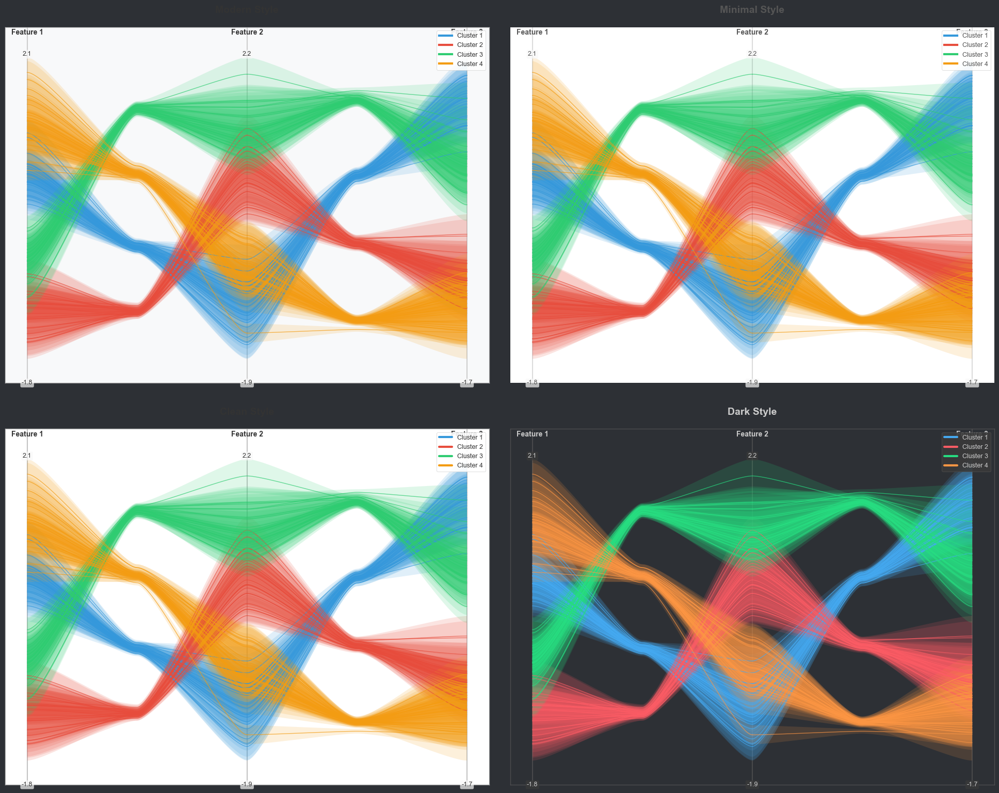

<Figure size 1200x800 with 0 Axes>

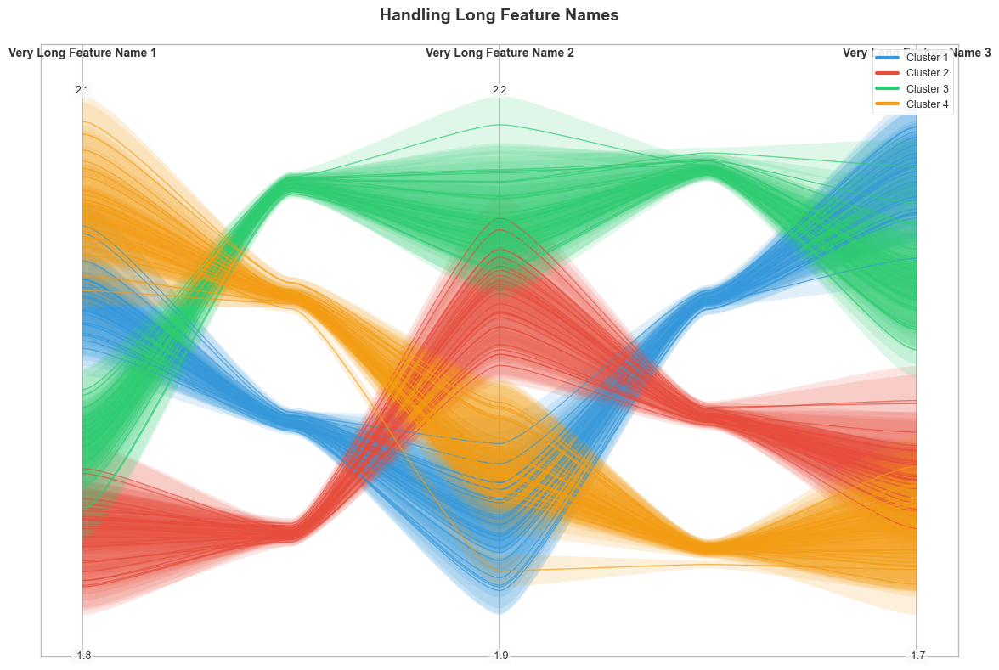

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as mpatches
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib as mpl


def generate_bezier_curve(p0, p1, p2, p3, num_points=50):
    """Generate a cubic Bezier curve from 4 control points."""
    t = np.linspace(0, 1, num_points)
    
    # Cubic Bezier formula
    curve = (1-t)**3 * p0[:, np.newaxis] + \
            3 * (1-t)**2 * t * p1[:, np.newaxis] + \
            3 * (1-t) * t**2 * p2[:, np.newaxis] + \
            t**3 * p3[:, np.newaxis]
    
    return curve.T


def compute_control_points(p_left, p_right, alpha=1/6, beta=0.8, centroid=None):
    """Compute control points for a cubic Bezier curve with C1 continuity."""
    # Middle point (original polyline intersection with virtual axis)
    mid_x = (p_left[0] + p_right[0]) / 2
    mid_y = (p_left[1] + p_right[1]) / 2
    
    # If we have a centroid for bundling, adjust the mid point
    if centroid is not None:
        # Original midpoint
        q = np.array([mid_x, mid_y])
        # Adjust midpoint towards centroid based on beta
        q_prime = q + beta * (centroid - q)
        mid_x, mid_y = q_prime
    
    # Control points for the left curve segment
    cp1_x = p_left[0] + alpha * (mid_x - p_left[0])
    cp1_y = p_left[1]
    
    # Control points for the right curve segment
    cp2_x = mid_x - alpha * (mid_x - p_left[0])
    cp2_y = mid_y
    
    cp3_x = mid_x + alpha * (p_right[0] - mid_x)
    cp3_y = mid_y
    
    cp4_x = p_right[0] - alpha * (p_right[0] - mid_x)
    cp4_y = p_right[1]
    
    return (mid_x, mid_y), (cp1_x, cp1_y), (cp2_x, cp2_y), (cp3_x, cp3_y), (cp4_x, cp4_y)


def create_interval_dataset(data, uncertainty_range=(0.1, 0.2), random_state=42):
    """Create interval data from any dataset by adding uncertainty."""
    n_samples, n_features = data.shape
    
    # Standardize original data for better comparison
    scaler = StandardScaler()
    data = scaler.fit_transform(data)
    
    # Generate random intervals for each data point
    np.random.seed(random_state)
    min_uncertainty, max_uncertainty = uncertainty_range
    uncertainty_lower = np.random.uniform(min_uncertainty, max_uncertainty, size=(n_samples, n_features))
    uncertainty_upper = np.random.uniform(min_uncertainty, max_uncertainty, size=(n_samples, n_features))
    
    # Create interval data
    interval_data = np.zeros((n_samples, n_features, 2))
    interval_data[:, :, 0] = data - uncertainty_lower  # lower bound
    interval_data[:, :, 1] = data + uncertainty_upper  # upper bound
    
    return interval_data


def plot_enhanced_parallel_coordinates(data, feature_names=None, clusters=None, 
                               alpha=1/6, beta=0.8, uncertainty_alpha=0.15,
                               figsize=(12, 8), ax=None, use_bundling=True, 
                               use_color=True, cmap='tab10', title="Parallel Coordinates",
                               show_legend=True, style="modern"):
    """
    Plot parallel coordinates with curve bundling for interval data with enhanced styling
    and fixed label positioning to avoid overlaps.
    
    Parameters:
    -----------
    data : numpy.ndarray
        Interval data in format (n_samples, n_dim, 2), where the last dimension 
        represents [lower, upper].
    feature_names : list, optional
        Names of features. If None, auto-generated names are used.
    clusters : numpy.ndarray, optional
        Cluster assignments for each data point. If None, all data is treated as one cluster.
    alpha : float, default=1/6
        Smoothness scale parameter (0-0.25).
    beta : float, default=0.8
        Bundling strength parameter (0-1).
    uncertainty_alpha : float, default=0.15
        Transparency of the uncertainty regions.
    figsize : tuple, default=(12, 8)
        Figure size if creating a new figure.
    ax : matplotlib.axes.Axes, optional
        Matplotlib axes to plot on. If None, a new figure is created.
    use_bundling : bool, default=True
        Whether to use curve bundling.
    use_color : bool, default=True
        Whether to use color coding for clusters.
    cmap : str, default='tab10'
        Colormap to use for clusters.
    title : str, default="Parallel Coordinates"
        Title for the plot.
    show_legend : bool, default=True
        Whether to show the legend for clusters.
    style : str, default="modern"
        Visual style for the plot. Options: "modern", "minimal", "clean", "dark"
    
    Returns:
    --------
    fig : matplotlib.figure.Figure
        The figure object.
    ax : matplotlib.axes.Axes
        The axes object.
    """
    # Set style based on parameter
    if style == "modern":
        plt.style.use('default')
        plt.rcParams['font.family'] = 'sans-serif'
        plt.rcParams['font.sans-serif'] = ['Arial', 'Helvetica', 'DejaVu Sans']
        background_color = '#f8f9fa'
        text_color = '#333333'
        axis_color = '#bbbbbb'
        grid_color = '#eeeeee'
    elif style == "minimal":
        plt.style.use('default')
        plt.rcParams['font.family'] = 'sans-serif'
        background_color = 'white'
        text_color = '#555555'
        axis_color = '#cccccc'
        grid_color = '#f5f5f5'
    elif style == "clean":
        plt.style.use('seaborn-v0_8-whitegrid')
        background_color = 'white'
        text_color = '#333333'
        axis_color = '#aaaaaa'
        grid_color = '#f0f0f0'
    elif style == "dark":
        plt.style.use('dark_background')
        background_color = '#2d3035'
        text_color = '#cccccc'
        axis_color = '#555555'
        grid_color = '#3a3a3a'
    else:
        # Default style
        plt.style.use('default')
        background_color = 'white'
        text_color = 'black'
        axis_color = 'black'
        grid_color = '#eeeeee'
    
    # Create figure and axes if not provided
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize, facecolor=background_color)
    else:
        fig = ax.figure
        fig.set_facecolor(background_color)
    
    ax.set_facecolor(background_color)
    
    n_samples, n_features = data.shape[0], data.shape[1]
    
    # If clusters is None, assign all to same cluster
    if clusters is None:
        clusters = np.zeros(n_samples, dtype=int)
    
    # Extract lower and upper bounds and compute center
    data_lower = data[:, :, 0]
    data_upper = data[:, :, 1]
    data_center = (data_lower + data_upper) / 2
    
    # If feature_names is None, auto-generate feature names
    if feature_names is None:
        feature_names = [f"Feature {i+1}" for i in range(n_features)]
    
    # Set up axes
    axes_x = np.linspace(0, 1, n_features)
    
    # Normalize data
    all_mins = np.min(data_lower, axis=0)
    all_maxs = np.max(data_upper, axis=0)
    
    # Handle potential division by zero
    range_values = all_maxs - all_mins
    range_values[range_values == 0] = 1  # Avoid division by zero
    
    norm_data_lower = (data_lower - all_mins) / range_values
    norm_data_upper = (data_upper - all_mins) / range_values
    norm_data_center = (data_center - all_mins) / range_values
    
    # Set up cluster colors with a better colormap if needed
    n_clusters = len(np.unique(clusters))
    
    if use_color:
        if n_clusters <= 10:
            # Use a curated set of distinct colors for fewer clusters
            if style == "dark":
                colors = ['#45aaf2', '#fc5c65', '#26de81', '#fd9644', '#a55eea', 
                         '#2bcbba', '#eb3b5a', '#4b7bec', '#20bf6b', '#778ca3']
            else:
                colors = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12', '#9b59b6', 
                         '#1abc9c', '#e84393', '#3867d6', '#27ae60', '#2c3e50']
            colors = colors[:n_clusters]
        else:
            # For more clusters, use a colormap
            cmap_obj = plt.cm.get_cmap(cmap)
            colors = [cmap_obj(i/max(1, n_clusters-1)) for i in range(n_clusters)]
    
    # Draw the axes with improved styling
    for i, x in enumerate(axes_x):
        # Main axis line
        ax.axvline(x=x, ymin=0, ymax=1, color=axis_color, alpha=0.7, linewidth=1.5, zorder=1)
        
        # Feature labels with better positioning to avoid overlaps
        if style == "dark":
            label_box_color = '#3a3a3a'
            label_text_color = '#ffffff'
        else:
            label_box_color = '#f8f8f8'
            label_text_color = '#333333'
        
        # Add feature label at top with more vertical space
        ax.text(x, 1.07, feature_names[i], ha='center', va='bottom', fontsize=10,
               color=text_color, fontweight='bold')
        
        # Format min and max values to be more concise
        min_val = all_mins[i]
        max_val = all_maxs[i]
        
        # Determine appropriate formatting based on the values
        if abs(min_val) < 0.1 or abs(min_val) > 1000:
            min_format = "{:.2e}"
        elif min_val == int(min_val):
            min_format = "{:.0f}"
        else:
            min_format = "{:.1f}"
            
        if abs(max_val) < 0.1 or abs(max_val) > 1000:
            max_format = "{:.2e}"
        elif max_val == int(max_val):
            max_format = "{:.0f}"
        else:
            max_format = "{:.1f}"
        
        # Add min and max values with increased spacing and better formatting
        ax.text(x, -0.07, min_format.format(min_val), ha='center', va='top', fontsize=9, 
               color=text_color, bbox=dict(facecolor=label_box_color, alpha=0.7, 
                                          edgecolor='none', boxstyle='round,pad=0.2'))
        
        ax.text(x, 1.0, max_format.format(max_val), ha='center', va='bottom', fontsize=9, 
               color=text_color, bbox=dict(facecolor=label_box_color, alpha=0.7, 
                                          edgecolor='none', boxstyle='round,pad=0.2'))
    
    # Calculate centroids for bundling
    if use_bundling:
        centroids = []
        for i in range(n_features - 1):
            cluster_centroids = {}
            for cluster_id in np.unique(clusters):
                cluster_mask = clusters == cluster_id
                
                # Skip clusters with no data points
                if not np.any(cluster_mask):
                    continue
                
                lefts = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i]), 
                    norm_data_center[cluster_mask, i]
                ])
                rights = np.column_stack([
                    np.full(np.sum(cluster_mask), axes_x[i+1]), 
                    norm_data_center[cluster_mask, i+1]
                ])
                
                midpoints = []
                for j in range(lefts.shape[0]):
                    mid_x = (lefts[j, 0] + rights[j, 0]) / 2
                    mid_y = (lefts[j, 1] + rights[j, 1]) / 2
                    midpoints.append((mid_x, mid_y))
                
                if midpoints:
                    midpoints = np.array(midpoints)
                    centroid = midpoints.mean(axis=0)
                    cluster_centroids[cluster_id] = centroid
            
            # Redistribute centroids
            if cluster_centroids:
                sorted_centroids = sorted(cluster_centroids.items(), key=lambda x: x[1][1])
                y_values = np.linspace(0.1, 0.9, len(sorted_centroids))
                for (cluster_id, _), y in zip(sorted_centroids, y_values):
                    x = (axes_x[i] + axes_x[i+1]) / 2
                    cluster_centroids[cluster_id] = np.array([x, y])
            
            centroids.append(cluster_centroids)
    
    # Draw each line and its uncertainty region
    for j in range(n_samples):
        line_data_lower = norm_data_lower[j]
        line_data_upper = norm_data_upper[j]
        line_data_center = norm_data_center[j]
        
        points_lower = np.column_stack([axes_x, line_data_lower])
        points_upper = np.column_stack([axes_x, line_data_upper])
        points_center = np.column_stack([axes_x, line_data_center])
        
        if use_color:
            line_color = colors[clusters[j]]
        else:
            line_color = 'steelblue'
        
        # For each pair of adjacent axes, draw curves
        for i in range(n_features - 1):
            if use_bundling:
                centroid = centroids[i].get(clusters[j], None)
            else:
                centroid = None
            
            # Center line control points
            p_left_center = points_center[i]
            p_right_center = points_center[i+1]
            
            (mid_x_center, mid_y_center), (cp1_x, cp1_y), (cp2_x, cp2_y), \
                (cp3_x, cp3_y), (cp4_x, cp4_y) = \
                compute_control_points(p_left_center, p_right_center, 
                                       alpha, beta, centroid)
            
            # Lower bound control points
            p_left_lower = points_lower[i]
            p_right_lower = points_lower[i+1]
            
            (mid_x_lower, mid_y_lower), (cp1_x_lower, cp1_y_lower), (cp2_x_lower, cp2_y_lower), \
                (cp3_x_lower, cp3_y_lower), (cp4_x_lower, cp4_y_lower) = \
                compute_control_points(p_left_lower, p_right_lower, 
                                      alpha, beta, centroid)
            
            # Upper bound control points
            p_left_upper = points_upper[i]
            p_right_upper = points_upper[i+1]
            
            (mid_x_upper, mid_y_upper), (cp1_x_upper, cp1_y_upper), (cp2_x_upper, cp2_y_upper), \
                (cp3_x_upper, cp3_y_upper), (cp4_x_upper, cp4_y_upper) = \
                compute_control_points(p_left_upper, p_right_upper, 
                                      alpha, beta, centroid)
            
            # Generate curves
            # Center curve (left to mid)
            curve1_center = generate_bezier_curve(
                p_left_center, 
                np.array([cp1_x, cp1_y]), 
                np.array([cp2_x, cp2_y]), 
                np.array([mid_x_center, mid_y_center])
            )
            
            # Center curve (mid to right)
            curve2_center = generate_bezier_curve(
                np.array([mid_x_center, mid_y_center]),
                np.array([cp3_x, cp3_y]),
                np.array([cp4_x, cp4_y]),
                p_right_center
            )
            
            curve_center = np.vstack([curve1_center, curve2_center])
            
            # Lower bound curve (left to mid)
            curve1_lower = generate_bezier_curve(
                p_left_lower, 
                np.array([cp1_x_lower, cp1_y_lower]), 
                np.array([cp2_x_lower, cp2_y_lower]), 
                np.array([mid_x_lower, mid_y_lower])
            )
            
            # Lower bound curve (mid to right)
            curve2_lower = generate_bezier_curve(
                np.array([mid_x_lower, mid_y_lower]),
                np.array([cp3_x_lower, cp3_y_lower]),
                np.array([cp4_x_lower, cp4_y_lower]),
                p_right_lower
            )
            
            curve_lower = np.vstack([curve1_lower, curve2_lower])
            
            # Upper bound curve (left to mid)
            curve1_upper = generate_bezier_curve(
                p_left_upper, 
                np.array([cp1_x_upper, cp1_y_upper]), 
                np.array([cp2_x_upper, cp2_y_upper]), 
                np.array([mid_x_upper, mid_y_upper])
            )
            
            # Upper bound curve (mid to right)
            curve2_upper = generate_bezier_curve(
                np.array([mid_x_upper, mid_y_upper]),
                np.array([cp3_x_upper, cp3_y_upper]),
                np.array([cp4_x_upper, cp4_y_upper]),
                p_right_upper
            )
            
            curve_upper = np.vstack([curve1_upper, curve2_upper])
            
            # Draw uncertainty region with improved styling
            verts = np.vstack([curve_lower, curve_upper[::-1]])
            poly = mpatches.Polygon(verts, closed=True, facecolor=line_color, 
                                   alpha=uncertainty_alpha, linewidth=0.0)
            ax.add_patch(poly)
            
            # Draw center line with improved styling
            ax.plot(curve_center[:, 0], curve_center[:, 1], color=line_color, 
                   alpha=0.7, linewidth=1.0, zorder=3)
    
    # Set axis limits with extended padding to accommodate labels
    ax.set_xlim(-0.05, 1.05)
    ax.set_ylim(-0.08, 1.10)  # Adjusted to make room for top and bottom labels
    
    # Remove ticks for a cleaner look
    ax.set_xticks([])
    ax.set_yticks([])
    
    # Improved border styling
    for spine in ax.spines.values():
        if style == "minimal":
            spine.set_visible(False)
        else:
            spine.set_color(axis_color)
            spine.set_linewidth(1.0)
            spine.set_alpha(0.8)
    
    # Add title with improved styling
    if title:
        ax.set_title(title, fontsize=14, fontweight='bold', color=text_color, pad=20)
    
    # Add legend with improved styling
    if use_color and n_clusters > 1 and show_legend:
        handles = []
        for i in range(n_clusters):
            # Create thicker, more visible lines for the legend
            handles.append(plt.Line2D([0], [0], color=colors[i], lw=3, 
                                     label=f'Cluster {i+1}'))
        
        # Place legend in a better position with improved styling
        if style == "dark":
            legend_bg = '#3a3a3a'
            legend_frame = '#555555'
        else:
            legend_bg = 'white'
            legend_frame = '#cccccc'
            
        legend = ax.legend(handles=handles, loc='upper right', frameon=True, 
                         facecolor=legend_bg, edgecolor=legend_frame,
                         framealpha=0.9, fontsize=9)
        legend.get_frame().set_linewidth(0.5)
        
        # Set legend text color
        for text in legend.get_texts():
            text.set_color(text_color)
    
    # Tight layout to ensure everything fits nicely
    plt.tight_layout()
    
    return fig, ax


# Example usage with synthetic data
if __name__ == "__main__":
    # Create synthetic dataset with 4 features and 4 clusters
    np.random.seed(42)
    n_samples = 100
    n_features = 3
    
    # Generate mean values for 4 different clusters
    cluster_centers = [
        [2.0, -1.0, 3.0],  # Cluster 1
        [-1.0, 2.0, -2.0],  # Cluster 2
        [0.0, 3.0, 1.0],    # Cluster 3
        [3.0, 0.0, -3.0]    # Cluster 4
    ]
    
    # Generate data points around these centers
    X = []
    true_clusters = []
    
    for i, center in enumerate(cluster_centers):
        n_cluster_samples = n_samples // len(cluster_centers)
        cluster_data = np.random.randn(n_cluster_samples, n_features) * 0.5 + center
        X.extend(cluster_data)
        true_clusters.extend([i] * n_cluster_samples)
    
    X = np.array(X)
    true_clusters = np.array(true_clusters)
    
    # Create interval data
    interval_data = create_interval_dataset(X, uncertainty_range=(0.1, 0.3))
    
    # Define feature names
    feature_names = ["Feature 1", "Feature 2", "Feature 3"]
    
    # Create plots with different styles
    fig, axs = plt.subplots(2, 2, figsize=(20, 16))
    
    # Modern style
    plot_enhanced_parallel_coordinates(
        interval_data, 
        feature_names=feature_names,
        clusters=true_clusters,
        ax=axs[0, 0],
        style="modern",
        title="Modern Style"
    )
    
    # Minimal style
    plot_enhanced_parallel_coordinates(
        interval_data, 
        feature_names=feature_names,
        clusters=true_clusters,
        ax=axs[0, 1],
        style="minimal",
        title="Minimal Style"
    )
    
    # Clean style
    plot_enhanced_parallel_coordinates(
        interval_data, 
        feature_names=feature_names,
        clusters=true_clusters,
        ax=axs[1, 0],
        style="clean",
        title="Clean Style"
    )
    
    # Dark style
    plot_enhanced_parallel_coordinates(
        interval_data, 
        feature_names=feature_names,
        clusters=true_clusters,
        ax=axs[1, 1],
        style="dark",
        title="Dark Style"
    )
    
    plt.tight_layout(pad=3.0)
    plt.show()

    # Create a plot with longer feature names to demonstrate label handling
    long_feature_names = [
        "Very Long Feature Name 1",
        "Very Long Feature Name 2",
        "Very Long Feature Name 3"
    ]
    
    plt.figure(figsize=(12, 8))
    plot_enhanced_parallel_coordinates(
        interval_data, 
        feature_names=long_feature_names,
        clusters=true_clusters,
        style="clean",
        title="Handling Long Feature Names"
    )
    plt.show()

/var/folders/xw/3jk8jclj72zgxr733zl929m80000gn/T/ipykernel_62908/3278900253.py:149: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]


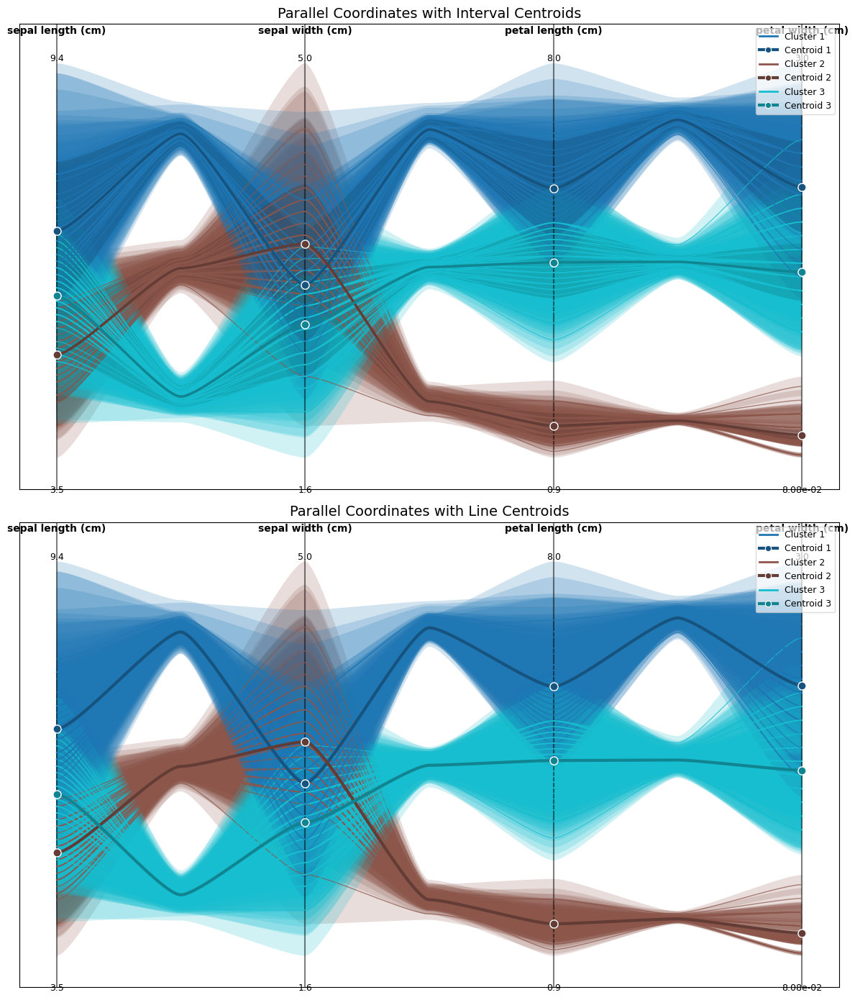

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
import matplotlib.patches as mpatches
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib as mpl


class IntervalParallelCoordinates:

    # Functions for generating Bezier curves
    @staticmethod
    def generate_bezier_curve(p0, p1, p2, p3, num_points=50):
        """Generate a cubic Bezier curve from 4 control points."""
        t = np.linspace(0, 1, num_points)
        
        # Cubic Bezier formula
        curve = (1-t)**3 * p0[:, np.newaxis] + \
                3 * (1-t)**2 * t * p1[:, np.newaxis] + \
                3 * (1-t) * t**2 * p2[:, np.newaxis] + \
                t**3 * p3[:, np.newaxis]
        
        return curve.T

    @staticmethod
    def compute_control_points(p_left, p_right, alpha=1/6, beta=0.8, centroid=None):
        """
        Compute the control points for a cubic Bezier curve between two points
        with proper C1 continuity.
        
        Parameters:
        - p_left: point at the left axis
        - p_right: point at the right axis
        - alpha: smoothness scale (0-0.25)
        - beta: bundling strength (0-1)
        - centroid: cluster centroid position at the virtual axis
        """
        # Middle point (original polyline intersection with virtual axis)
        mid_x = (p_left[0] + p_right[0]) / 2
        mid_y = (p_left[1] + p_right[1]) / 2
        
        # If we have a centroid for bundling, adjust the mid point
        if centroid is not None:
            # Original midpoint
            q = np.array([mid_x, mid_y])
            # Adjust midpoint towards centroid based on beta
            q_prime = q + beta * (centroid - q)
            mid_x, mid_y = q_prime
        
        # Control points for the left curve segment
        cp1_x = p_left[0] + alpha * (mid_x - p_left[0])
        cp1_y = p_left[1]
        
        # Control points for the right curve segment
        cp2_x = mid_x - alpha * (mid_x - p_left[0])
        cp2_y = mid_y
        
        cp3_x = mid_x + alpha * (p_right[0] - mid_x)
        cp3_y = mid_y
        
        cp4_x = p_right[0] - alpha * (p_right[0] - mid_x)
        cp4_y = p_right[1]
        
        return (mid_x, mid_y), (cp1_x, cp1_y), (cp2_x, cp2_y), (cp3_x, cp3_y), (cp4_x, cp4_y)

    @staticmethod
    def plot_interval_curves(data, feature_names=None, clusters=None, alpha=1/6, beta=0.8, ax=None, 
                    use_bundling=True, use_color=True, uncertainty_alpha=0.2, 
                    show_centroids=True, centroid_style="interval"):
        """
        Plot parallel coordinates with curve bundling for interval data.
        
        Parameters:
        - data: interval data in format (n_samples, n_dim, 2), where the last dimension represents [lower, upper]
        - feature_names: list of feature names, if None, will auto-generate names
        - clusters: cluster assignments, if None, all data will be treated as one cluster
        - alpha: smoothness scale (0-0.25)
        - beta: bundling strength (0-1)
        - ax: matplotlib axis
        - use_bundling: whether to use curve bundling
        - use_color: whether to use color coding
        - uncertainty_alpha: transparency of uncertainty regions
        - show_centroids: whether to display cluster centroids
        - centroid_style: "interval" for interval centroid, "line" for line centroid
        """
        if ax is None:
            fig, ax = plt.subplots(figsize=(12, 8))
        
        n_samples, n_features = data.shape[0], data.shape[1]
        
        # If feature_names is None, auto-generate feature names
        if feature_names is None:
            feature_names = [f"Feature {i+1}" for i in range(n_features)]
        
        # Set up axes - dynamically adapt to number of dimensions
        axes_x = np.linspace(0, 1, n_features)
        
        # Extract lower and upper bounds
        data_lower = data[:, :, 0]
        data_upper = data[:, :, 1]
        data_center = (data_lower + data_upper) / 2
        
        # Normalize data
        all_mins = np.min(data_lower, axis=0)
        all_maxs = np.max(data_upper, axis=0)
        
        # Handle potential division by zero
        range_values = all_maxs - all_mins
        range_values[range_values == 0] = 1  # Avoid division by zero
        
        norm_data_lower = (data_lower - all_mins) / range_values
        norm_data_upper = (data_upper - all_mins) / range_values
        norm_data_center = (data_center - all_mins) / range_values
        
        # Draw the axes with better spacing
        for i, x in enumerate(axes_x):
            ax.axvline(x=x, ymin=0, ymax=1, color='black', alpha=0.5)
            ax.text(x, 1.07, feature_names[i], ha='center', va='bottom', fontsize=10, fontweight='bold')
        
            # Format min and max values
            min_val = all_mins[i]
            max_val = all_maxs[i]
            
            # Determine appropriate formatting
            if abs(min_val) < 0.1 or abs(min_val) > 1000:
                min_format = "{:.2e}"
            elif min_val == int(min_val):
                min_format = "{:.0f}"
            else:
                min_format = "{:.1f}"
                
            if abs(max_val) < 0.1 or abs(max_val) > 1000:
                max_format = "{:.2e}"
            elif max_val == int(max_val):
                max_format = "{:.0f}"
            else:
                max_format = "{:.1f}"
            
            # Add value labels with better spacing
            ax.text(x, -0.07, min_format.format(min_val), ha='center', va='top', fontsize=9)
            ax.text(x, 1.0, max_format.format(max_val), ha='center', va='bottom', fontsize=9)
        
        # Set up cluster colors
        if clusters is None:
            clusters = np.zeros(n_samples, dtype=int)
        
        n_clusters = len(np.unique(clusters))
        colors = [plt.cm.get_cmap('tab10')(i/max(1, n_clusters-1)) for i in range(n_clusters)]
        
        # Calculate centroids for bundling and for display
        if use_bundling or show_centroids:
            centroids = []
            cluster_data_centroids = {}  # Store actual data centroids for each cluster
            
            # Calculate data centroids for each cluster
            for cluster_id in np.unique(clusters):
                cluster_mask = clusters == cluster_id
                
                # Initialize arrays to store centroid interval data
                centroid_lower = np.zeros(n_features)
                centroid_upper = np.zeros(n_features)
                centroid_center = np.zeros(n_features)
                
                # Calculate cluster centroids for each feature
                for i in range(n_features):
                    # Calculate mean, min, max for this feature in this cluster
                    centroid_lower[i] = np.mean(data_lower[cluster_mask, i])
                    centroid_upper[i] = np.mean(data_upper[cluster_mask, i])
                    centroid_center[i] = np.mean(data_center[cluster_mask, i])
                
                # Normalize centroid data
                norm_centroid_lower = (centroid_lower - all_mins) / range_values
                norm_centroid_upper = (centroid_upper - all_mins) / range_values
                norm_centroid_center = (centroid_center - all_mins) / range_values
                
                # Store the centroid data
                cluster_data_centroids[cluster_id] = {
                    'lower': norm_centroid_lower,
                    'upper': norm_centroid_upper,
                    'center': norm_centroid_center,
                    'raw_lower': centroid_lower,
                    'raw_upper': centroid_upper,
                    'raw_center': centroid_center
                }
            
            # Calculate bundling centroids for each segment between axes
            bundling_centroids = []
            for i in range(n_features - 1):
                cluster_bundling_centroids = {}
                for cluster_id in np.unique(clusters):
                    cluster_mask = clusters == cluster_id
                    
                    # Skip clusters with no data points
                    if not np.any(cluster_mask):
                        continue
                    
                    lefts = np.column_stack([
                        np.full(np.sum(cluster_mask), axes_x[i]), 
                        norm_data_center[cluster_mask, i]
                    ])
                    rights = np.column_stack([
                        np.full(np.sum(cluster_mask), axes_x[i+1]), 
                        norm_data_center[cluster_mask, i+1]
                    ])
                    
                    midpoints = []
                    for j in range(lefts.shape[0]):
                        mid_x = (lefts[j, 0] + rights[j, 0]) / 2
                        mid_y = (lefts[j, 1] + rights[j, 1]) / 2
                        midpoints.append((mid_x, mid_y))
                    
                    if midpoints:
                        midpoints = np.array(midpoints)
                        centroid = midpoints.mean(axis=0)
                        cluster_bundling_centroids[cluster_id] = centroid
                
                # Redistribute bundling centroids
                if cluster_bundling_centroids:
                    sorted_centroids = sorted(cluster_bundling_centroids.items(), key=lambda x: x[1][1])
                    y_values = np.linspace(0.1, 0.9, len(sorted_centroids))
                    for (cluster_id, _), y in zip(sorted_centroids, y_values):
                        x = (axes_x[i] + axes_x[i+1]) / 2
                        cluster_bundling_centroids[cluster_id] = np.array([x, y])
                
                bundling_centroids.append(cluster_bundling_centroids)
        
        # Draw each line and its uncertainty region
        for j in range(n_samples):
            line_data_lower = norm_data_lower[j]
            line_data_upper = norm_data_upper[j]
            line_data_center = norm_data_center[j]
            
            points_lower = np.column_stack([axes_x, line_data_lower])
            points_upper = np.column_stack([axes_x, line_data_upper])
            points_center = np.column_stack([axes_x, line_data_center])
            
            if use_color:
                line_color = colors[clusters[j]]
            else:
                line_color = 'steelblue'
            
            # For each pair of adjacent axes, draw curves
            for i in range(n_features - 1):
                if use_bundling:
                    centroid = bundling_centroids[i].get(clusters[j], None)
                else:
                    centroid = None
                
                # Center line control points
                p_left_center = points_center[i]
                p_right_center = points_center[i+1]
                
                (mid_x_center, mid_y_center), (cp1_x, cp1_y), (cp2_x, cp2_y), \
                    (cp3_x, cp3_y), (cp4_x, cp4_y) = \
                    IntervalParallelCoordinates.compute_control_points(p_left_center, p_right_center, alpha, beta, centroid)
                
                # Lower bound control points
                p_left_lower = points_lower[i]
                p_right_lower = points_lower[i+1]
                
                (mid_x_lower, mid_y_lower), (cp1_x_lower, cp1_y_lower), (cp2_x_lower, cp2_y_lower), \
                    (cp3_x_lower, cp3_y_lower), (cp4_x_lower, cp4_y_lower) = \
                    IntervalParallelCoordinates.compute_control_points(p_left_lower, p_right_lower, alpha, beta, centroid)
                
                # Upper bound control points
                p_left_upper = points_upper[i]
                p_right_upper = points_upper[i+1]
                
                (mid_x_upper, mid_y_upper), (cp1_x_upper, cp1_y_upper), (cp2_x_upper, cp2_y_upper), \
                    (cp3_x_upper, cp3_y_upper), (cp4_x_upper, cp4_y_upper) = \
                    IntervalParallelCoordinates.compute_control_points(p_left_upper, p_right_upper, alpha, beta, centroid)
                
                # Generate curves
                # Center curve (left to mid)
                curve1_center = IntervalParallelCoordinates.generate_bezier_curve(
                    p_left_center, 
                    np.array([cp1_x, cp1_y]), 
                    np.array([cp2_x, cp2_y]), 
                    np.array([mid_x_center, mid_y_center])
                )
                
                # Center curve (mid to right)
                curve2_center = IntervalParallelCoordinates.generate_bezier_curve(
                    np.array([mid_x_center, mid_y_center]),
                    np.array([cp3_x, cp3_y]),
                    np.array([cp4_x, cp4_y]),
                    p_right_center
                )
                
                curve_center = np.vstack([curve1_center, curve2_center])
                
                # Lower bound curve (left to mid)
                curve1_lower = IntervalParallelCoordinates.generate_bezier_curve(
                    p_left_lower, 
                    np.array([cp1_x_lower, cp1_y_lower]), 
                    np.array([cp2_x_lower, cp2_y_lower]), 
                    np.array([mid_x_lower, mid_y_lower])
                )
                
                # Lower bound curve (mid to right)
                curve2_lower = IntervalParallelCoordinates.generate_bezier_curve(
                    np.array([mid_x_lower, mid_y_lower]),
                    np.array([cp3_x_lower, cp3_y_lower]),
                    np.array([cp4_x_lower, cp4_y_lower]),
                    p_right_lower
                )
                
                curve_lower = np.vstack([curve1_lower, curve2_lower])
                
                # Upper bound curve (left to mid)
                curve1_upper = IntervalParallelCoordinates.generate_bezier_curve(
                    p_left_upper, 
                    np.array([cp1_x_upper, cp1_y_upper]), 
                    np.array([cp2_x_upper, cp2_y_upper]), 
                    np.array([mid_x_upper, mid_y_upper])
                )
                
                # Upper bound curve (mid to right)
                curve2_upper = IntervalParallelCoordinates.generate_bezier_curve(
                    np.array([mid_x_upper, mid_y_upper]),
                    np.array([cp3_x_upper, cp3_y_upper]),
                    np.array([cp4_x_upper, cp4_y_upper]),
                    p_right_upper
                )
                
                curve_upper = np.vstack([curve1_upper, curve2_upper])
                
                # Draw uncertainty region
                verts = np.vstack([curve_lower, curve_upper[::-1]])
                poly = mpatches.Polygon(verts, closed=True, facecolor=line_color, alpha=uncertainty_alpha)
                ax.add_patch(poly)
                
                # Draw center line
                ax.plot(curve_center[:, 0], curve_center[:, 1], color=line_color, alpha=0.7, linewidth=1)
        
        # Draw cluster centroids
        if show_centroids:
            for cluster_id in np.unique(clusters):
                # Get the centroid data for this cluster
                centroid_data = cluster_data_centroids[cluster_id]
                
                # Use a darker, more saturated version of the cluster color
                base_color = np.array(colors[cluster_id])
                # Make color darker for centroid
                dark_color = np.clip(base_color * 0.7, 0, 1)
                dark_color[3] = 1.0  # Full opacity
                
                if centroid_style == "interval":
                    # Draw interval region for centroid
                    for i in range(n_features - 1):
                        # Get points for the centroids
                        p_left_lower = np.array([axes_x[i], centroid_data['lower'][i]])
                        p_right_lower = np.array([axes_x[i+1], centroid_data['lower'][i+1]])
                        p_left_upper = np.array([axes_x[i], centroid_data['upper'][i]])
                        p_right_upper = np.array([axes_x[i+1], centroid_data['upper'][i+1]])
                        p_left_center = np.array([axes_x[i], centroid_data['center'][i]])
                        p_right_center = np.array([axes_x[i+1], centroid_data['center'][i+1]])
                        
                        # Get centroid point for bundling
                        centroid = bundling_centroids[i].get(cluster_id, None)
                        
                        # Calculate control points
                        (mid_x_center, mid_y_center), (cp1_x, cp1_y), (cp2_x, cp2_y), \
                            (cp3_x, cp3_y), (cp4_x, cp4_y) = \
                            IntervalParallelCoordinates.compute_control_points(p_left_center, p_right_center, 
                                                                alpha, beta, centroid)
                        
                        (mid_x_lower, mid_y_lower), (cp1_x_lower, cp1_y_lower), (cp2_x_lower, cp2_y_lower), \
                            (cp3_x_lower, cp3_y_lower), (cp4_x_lower, cp4_y_lower) = \
                            IntervalParallelCoordinates.compute_control_points(p_left_lower, p_right_lower, 
                                                                alpha, beta, centroid)
                        
                        (mid_x_upper, mid_y_upper), (cp1_x_upper, cp1_y_upper), (cp2_x_upper, cp2_y_upper), \
                            (cp3_x_upper, cp3_y_upper), (cp4_x_upper, cp4_y_upper) = \
                            IntervalParallelCoordinates.compute_control_points(p_left_upper, p_right_upper, 
                                                                alpha, beta, centroid)
                        
                        # Generate curves
                        curve1_center = IntervalParallelCoordinates.generate_bezier_curve(
                            p_left_center, 
                            np.array([cp1_x, cp1_y]), 
                            np.array([cp2_x, cp2_y]), 
                            np.array([mid_x_center, mid_y_center])
                        )
                        
                        curve2_center = IntervalParallelCoordinates.generate_bezier_curve(
                            np.array([mid_x_center, mid_y_center]),
                            np.array([cp3_x, cp3_y]),
                            np.array([cp4_x, cp4_y]),
                            p_right_center
                        )
                        
                        curve_center = np.vstack([curve1_center, curve2_center])
                        
                        curve1_lower = IntervalParallelCoordinates.generate_bezier_curve(
                            p_left_lower, 
                            np.array([cp1_x_lower, cp1_y_lower]), 
                            np.array([cp2_x_lower, cp2_y_lower]), 
                            np.array([mid_x_lower, mid_y_lower])
                        )
                        
                        curve2_lower = IntervalParallelCoordinates.generate_bezier_curve(
                            np.array([mid_x_lower, mid_y_lower]),
                            np.array([cp3_x_lower, cp3_y_lower]),
                            np.array([cp4_x_lower, cp4_y_lower]),
                            p_right_lower
                        )
                        
                        curve_lower = np.vstack([curve1_lower, curve2_lower])
                        
                        curve1_upper = IntervalParallelCoordinates.generate_bezier_curve(
                            p_left_upper, 
                            np.array([cp1_x_upper, cp1_y_upper]), 
                            np.array([cp2_x_upper, cp2_y_upper]), 
                            np.array([mid_x_upper, mid_y_upper])
                        )
                        
                        curve2_upper = IntervalParallelCoordinates.generate_bezier_curve(
                            np.array([mid_x_upper, mid_y_upper]),
                            np.array([cp3_x_upper, cp3_y_upper]),
                            np.array([cp4_x_upper, cp4_y_upper]),
                            p_right_upper
                        )
                        
                        curve_upper = np.vstack([curve1_upper, curve2_upper])
                        
                        # Draw uncertainty region with higher alpha
                        verts = np.vstack([curve_lower, curve_upper[::-1]])
                        poly = mpatches.Polygon(verts, closed=True, facecolor=dark_color, 
                                              alpha=0.4, linewidth=0)
                        ax.add_patch(poly)
                        
                        # Draw center line with thicker line
                        ax.plot(curve_center[:, 0], curve_center[:, 1], color=dark_color, 
                              alpha=1.0, linewidth=2.5, zorder=10)
                    
                    # Draw markers at centroid points on each axis
                    for i in range(n_features):
                        ax.plot(axes_x[i], centroid_data['center'][i], 'o', 
                              color=dark_color, markersize=8, markeredgecolor='white', 
                              markeredgewidth=1.0, zorder=11)
                
                else:  # "line" style centroid
                    # Draw just the center line for the centroid
                    points_center = np.column_stack([axes_x, centroid_data['center']])
                    
                    for i in range(n_features - 1):
                        p_left_center = points_center[i]
                        p_right_center = points_center[i+1]
                        
                        centroid = bundling_centroids[i].get(cluster_id, None)
                        
                        (mid_x_center, mid_y_center), (cp1_x, cp1_y), (cp2_x, cp2_y), \
                            (cp3_x, cp3_y), (cp4_x, cp4_y) = \
                            IntervalParallelCoordinates.compute_control_points(p_left_center, p_right_center, 
                                                                alpha, beta, centroid)
                        
                        curve1_center = IntervalParallelCoordinates.generate_bezier_curve(
                            p_left_center, 
                            np.array([cp1_x, cp1_y]), 
                            np.array([cp2_x, cp2_y]), 
                            np.array([mid_x_center, mid_y_center])
                        )
                        
                        curve2_center = IntervalParallelCoordinates.generate_bezier_curve(
                            np.array([mid_x_center, mid_y_center]),
                            np.array([cp3_x, cp3_y]),
                            np.array([cp4_x, cp4_y]),
                            p_right_center
                        )
                        
                        curve_center = np.vstack([curve1_center, curve2_center])
                        
                        # Draw center line with thicker line
                        ax.plot(curve_center[:, 0], curve_center[:, 1], color=dark_color, 
                              alpha=1.0, linewidth=3.0, zorder=10)
                    
                    # Draw markers at centroid points on each axis
                    for i in range(n_features):
                        ax.plot(axes_x[i], centroid_data['center'][i], 'o', 
                              color=dark_color, markersize=8, markeredgecolor='white', 
                              markeredgewidth=1.0, zorder=11)
        
        # Set axis limits with extended padding
        ax.set_xlim(-0.05, 1.05)
        ax.set_ylim(-0.08, 1.10)
        ax.set_xticks([])
        ax.set_yticks([])
        
        # Add legend with improved styling
        if use_color and n_clusters > 1:
            handles = []
            for i in range(n_clusters):
                # Create entries for regular cluster lines
                handles.append(plt.Line2D([0], [0], color=colors[i], lw=2, label=f'Cluster {i+1}'))
                
                # If centroids are shown, add entries for centroids too
                if show_centroids:
                    dark_color = np.clip(np.array(colors[i]) * 0.7, 0, 1)
                    dark_color[3] = 1.0
                    handles.append(plt.Line2D([0], [0], color=dark_color, lw=3, 
                                           marker='o', markersize=6, markeredgecolor='white',
                                           markeredgewidth=0.8,
                                           label=f'Centroid {i+1}'))
            
            ax.legend(handles=handles, loc='upper right', frameon=True, 
                     fontsize=9, framealpha=0.7)
        
        # Apply tight layout
        plt.tight_layout()
        
        return ax


# Example usage
if __name__ == "__main__":
    import numpy as np
    import matplotlib.pyplot as plt
    from sklearn.datasets import load_iris
    from sklearn.cluster import KMeans
    
    # Load iris dataset
    iris = load_iris()
    data = iris.data
    feature_names = iris.feature_names
    
    # Generate interval data
    n_samples, n_features = data.shape
    np.random.seed(42)
    uncertainty = np.random.uniform(0.1, 0.2, size=(n_samples, n_features))
    
    # Create interval data in the format (n_samples, n_dim, 2)
    interval_data = np.zeros((n_samples, n_features, 2))
    interval_data[:, :, 0] = data - uncertainty * data  # lower bound
    interval_data[:, :, 1] = data + uncertainty * data  # upper bound
    
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=3, random_state=42)
    clusters = kmeans.fit_predict(data)
    
    # Create figure
    fig, axs = plt.subplots(2, 1, figsize=(12, 14))
    
    # Plot with interval centroids
    IntervalParallelCoordinates.plot_interval_curves(
        interval_data, 
        feature_names=feature_names,
        clusters=clusters,
        ax=axs[0], 
        show_centroids=True,
        centroid_style="interval"
    )
    axs[0].set_title("Parallel Coordinates with Interval Centroids", fontsize=14)
    
    # Plot with line centroids
    IntervalParallelCoordinates.plot_interval_curves(
        interval_data, 
        feature_names=feature_names,
        clusters=clusters,
        ax=axs[1],
        show_centroids=True,
        centroid_style="line"
    )
    axs[1].set_title("Parallel Coordinates with Line Centroids", fontsize=14)
    
    plt.tight_layout()
    plt.show()